# **Entrega 2 - Proyecto Integrador**
**Grupo 8 - 5K9 (Bürky, Lucía - Citro, Camila)**

En este Notebook se desarrolla la segunda entrega del Proyecto Integrador de Ciencia de Datos, utilizando el CSV final de canciones obtenido en la entrega anterior.

# Descarga del archivo con los datos


In [ ]:
import pandas as pd
!gdown 1eHEuq722G0bSG70VhK6JTy4PGAZRvbll
songs_info = pd.read_csv("acousticbrainz_canciones.csv")
# songs_info = pd.read_csv("acousticbrainz_canciones.csv")

Downloading...
From: https://drive.google.com/uc?id=1eHEuq722G0bSG70VhK6JTy4PGAZRvbll
To: /content/acousticbrainz_canciones.csv
100% 21.2M/21.2M [00:00<00:00, 48.7MB/s]


Para probar que se haya descargado correctamente el archivo songs_info, mostramos algunos datos estadísticos importantes usando `describe()`.

In [ ]:
songs_info.describe()

,length,sad,happy,party,relaxed,acoustic,danceable,tonal,bright,instrumental
count,77986.000000,77986.000000,7.798600e+04,7.798600e+04,77986.000000,7.798600e+04,7.798600e+04,7.798600e+04,77986.000000,7.798600e+04
mean,254.872314,0.407494,3.942820e-01,3.693954e-01,0.590259,3.661226e-01,4.844342e-01,4.828356e-01,0.570671,4.296183e-01
std,127.786330,0.242098,2.872701e-01,3.196670e-01,0.335479,3.703546e-01,3.917013e-01,3.709125e-01,0.374320,3.880216e-01
min,1.068118,0.001504,3.000001e-14,2.952447e-07,0.000498,3.000001e-14,3.000001e-14,3.000001e-14,0.000001,9.913174e-07
25%,182.961639,0.216939,1.428452e-01,5.815683e-02,0.261886,2.494873e-02,7.935715e-02,9.270417e-02,0.173204,4.636224e-02
50%,231.888977,0.362886,3.427792e-01,3.004196e-01,0.713252,1.964793e-01,4.296173e-01,4.724754e-01,0.661284,3.067156e-01
75%,296.411438,0.580194,6.230087e-01,6.555174e-01,0.882164,7.481721e-01,9.323509e-01,8.696575e-01,0.948169,8.635270e-01
max,2943.158936,0.991110,9.999999e-01,9.999993e-01,1.000000,9.999999e-01,9.999999e-01,9.999983e-01,1.000000,1.000000e+00


# *Parte 1: Preprocesamiento*
En esta sección del Notebook limpiaremos nuestros los datos, ejecutando un pipe.
La idea es eliminar datos que sean nulos y columnas innecesarias. Además, nuestro objetivo también es normalizar los datos, como por ejemplo las fechas, para que todo posea el mismo formato y así facilitar nuestro análisis.

### **1. Función explorar**
En esta función del pipe, vamos a comenzar explorando los datos.
Queremos conocer la cantidad de registros de datos que tenemos (filas), la cantidad de columnas, los tipos de datos y la cantidad de columnas que poseen algún valor nulo (que luego nos servira para eliminar las que posean muchos valores nulos).

In [ ]:
def explorar(df):
  size = df.shape # cantidad de filas y columnas
  data_types = df.dtypes # tipos de datos de cada columna
  cols_with_nulls = df.columns[df.isna().any()] # columnas con valores nulos
  print(f"Cantidad de filas: {size[0]}")
  print(f"Cantidad de columnas: {size[1]}")
  print(f"Columnas con valores nulos: {cols_with_nulls}")
  print("Tipos de datos:")
  print(df.dtypes)

  return df

### **2. Funcion limpiar**
En esta sección analizaremos las columnas que pueden llegar a darnos problemas. Para ello, queremos conocer la cantidad de valores nulos que posee cada columna, y el porcentaje del total de datos que representa esa cantidad. Esto nos permitirá eliminar columnas que posean un porcentaje igual o mayor al 50% (ya que eso significa que la mitad o más datos se encuentran con valores nulos para esa columna).

In [ ]:
total_registros = songs_info.shape[0]
cols_with_nulls = songs_info.columns[songs_info.isna().any()]
resumen_nulos = songs_info[cols_with_nulls].isna().sum().reset_index()
resumen_nulos.columns = ['columna', 'cantidad_nulos']
resumen_nulos["porc_nulos"] = (resumen_nulos["cantidad_nulos"] / total_registros * 100).round(2)

resumen_nulos

,columna,cantidad_nulos,porc_nulos
0,title,725,0.93
1,artist_name,691,0.89
2,artist_mbid,27984,35.88
3,date,2508,3.22


Como podemos observar, las columnas problemáticas son: `date`, `genre`, `title` y `language`.
Dado que el género y el título de las canciones son necesarios para nuestro análisis, no eliminaremos estás columnas. Además, las mismas no poseen tantos valores nulos como otras. Por lo que, para no tener problemas con dichas columnas, se hará lo siguiente:
* Se eliminarán las filas que posean valores nulos en la columna `title`.
* Se escribirá "Desconocido" en las filas que posean valores nulos en la columna `genre`.

Con respecto a la columna `language`, esta se eliminará ya que posee un porcentaje muy grande de valores nulos (supera el 50%), además de tratarse de una columna no tan necesaria. Asimismo, se eliminará la columna `artist_mbid` ya que también es innecesaria.

Por último, se normalizarán los valores de la columna `date`, de manera que sólo contenga el año de la canción. Y para el caso de valores nulos, se colocará el valor 0.

In [ ]:
def limpiar(df):
  # Eliminamos columnas innecesarias o nulas
  # clean_df = df.drop(columns="language")
  # clean_df = clean_df.drop(columns="artist_mbid")
  clean_df = df.drop(columns="artist_mbid")

  # Eliminamos filas con titulos de canciones nulos
  clean_df = clean_df[~clean_df["title"].isna()]

  # Reemplazamos por 0 las canciones sin fecha
  clean_df['date'] = clean_df['date'].fillna('0')

  # Reemplazamos por 'Desconocido' las canciones sin genero
  # clean_df['genre'] = clean_df['genre'].fillna('Desconocido')

  # Dejar solo el anio en la columna de la fecha, se extraen los primeros 4 caracteres de la columna date
  # Si no existe, se deja el 0. Tambien se parsea la columna a entero, no string
  df_fecha = clean_df
  df_fecha["date"] = clean_df["date"].str.extract(r"(\d{4})").fillna("0").astype(int)

  return df_fecha

### **3. Funcion arreglar_duracion**

En esta funcion, vamos a transformar la duración. Anteriormente ésta se encontraba en segundos y ahora queremos que se encuentre en minutos. por lo que vamos a dividir los valores de la columna `length` por 60, para que la duracion de cada cancion se exprese en minutos en vez de segundos.

In [ ]:
def arreglar_duracion(df):
  df_duracion = df
  df_duracion["length"] = df["length"] / 60

  return df_duracion

### **4. Funcion fechas_raras**

Ahora, prepararemos las fechas para luego poder agregar una nueva columna, donde se dividirán las canciones por décadas.
Para ello, primero obtenemos el valor mínimo y el valor máximo, para conocer desde qué década tenemos canciones.

In [ ]:
def imprimir_limites(df):
  minimo = df.query("date > 0")['date'].min()
  maximo = df['date'].max()

  print("Minimo: ", minimo)
  print("Maximo: ", maximo)

Además, para todas las canciones con años extraños por ejemplo, con el año 501, modificaremos ese valor y colocaremos en su lugar el valor de la moda según el `genre_rosamerica`. Se hace lo mismo con aquellos que tenían Date 0.

In [ ]:
def fechas_raras(df):
  imprimir_limites(df)
  df_raras = df
  df_raras.loc[(df_raras["date"] >= 0) & (df_raras["date"] < 1800), "date"] = float('nan')

  imprimir_limites(df_raras)
  df_raras['date'] = df_raras.groupby('genre_rosamerica')['date'].transform(
        lambda x: x.fillna(x.mode()[0] if not x.mode().empty else x)
  )

  df_raras['date'] = df_raras['date'].astype(int)
  return df_raras

Al imprimir los límites luego de eliminar las fechas raras, obtuvimos que la minima `date` era 1967. Por lo que nuestras décadas comenzarán por los 70's.
Además, para el caso de las canciones que presentaban el valor 0, se colocará el mismo valor para la década.

### **5. Funcion decadas**

Como se nombró anteriormente, en esta función vamos a clasificar las canciones segun su década, comenzando por los 70's.

In [ ]:
def clasificar_por_decada(anio):
  if anio == 0:
    return 0
  if anio < 1910:
    return 1900
  if anio < 1920:
    return 1910
  if anio < 1930:
    return 1920
  if anio < 1940:
    return 1930
  elif anio < 1950:
    return 1940
  if anio < 1960:
    return 1950
  if anio < 1970:
    return 1960
  elif anio < 1980:
    return 1970
  elif anio < 1990:
    return 1980
  elif anio < 2000:
    return 1990
  elif anio < 2010:
    return 2000
  elif anio < 2020:
    return 2010
  elif anio < 4000:
    return 2020

def agregar_decadas(df):
  df_decadas = df
  df_decadas["decada"] = df_decadas["date"].apply(clasificar_por_decada)

  return df_decadas

### **6. Funcion longitud_titulo**

En esta función, obtendremos la longitud de los títulos de las canciones y lo colocaremos en una nueva columna porque podría llegar a ser útil en análisis futuros.

In [ ]:
def longitud_titulo(df):
  df_nuevo = df
  df_nuevo["longitud_titulo"] = df_nuevo["title"].str.len()

  return df_nuevo

### **7. Funcion eliminar_columna_genre**

En esta función, vamos a eliminar la columna `genre`, ya que posee valores nulos y hemos conseguido las columnas de `genre_dortmund`, `genre_rosamerica`	`genre_tzanetakis` que son más fiables y completas.

### **8. Funcion limpiar_generos**

En esta función, vamos a limpiar las columnas de `genre_dortmund`, `genre_rosamerica`	`genre_tzanetakis`, colocando mayúsculas en la primera letra de cada palabra.
Además, en el caso de Rosamerica y Tzanetakis vamos a reemplazar lo que está en esas columnas por las palabras completas de los géneros.
Por ejemplo, vamos a reemplazar "roc" por "Rock".

In [ ]:
def limpiar_generos(df):
  # Copiamos df en clean_genre_df
  clean_genre_df = df

  # En la columna genre_dortmund, reemplazamos la primera letra de la palabra por su mayuscula
  clean_genre_df["genre_dortmund"] = clean_genre_df["genre_dortmund"].str.capitalize()

  # Hacemos un map con clave-valor, para reemplazar los generos en Rosamerica
  mapeo_rosamerica = {
    "cla": "Classic",
    "dan": "Dance",
    "hip": "Hip-Hop",
    "jaz": "Jazz",
    "pop": "Pop",
    "rhy": "Rhythmic",
    "roc": "Rock",
    "spe": "Speech"
  }
  clean_genre_df["genre_rosamerica"] = clean_genre_df["genre_rosamerica"].map(mapeo_rosamerica)

  # Hacemos un map con clave-valor, para reemplazar los generos en Tzanetakis
  mapeo_tzanetakis = {
    "blu": "Blues",
    "hip": "Hip-Hop",
    "jaz": "Jazz",
    "pop": "Pop",
    "roc": "Rock",
    "cla": "Classic",
    "cou": "Country",
    "dis": "Disco",
    "met": "Metal",
    "reg": "Reggae"
  }
  clean_genre_df["genre_tzanetakis"] = clean_genre_df["genre_tzanetakis"].map(mapeo_tzanetakis)

  return clean_genre_df

# Pipe final
A continuación, se presenta el pipe final. El cual presenta la ejecución de cada función descrita anteriormente.

In [ ]:
df = (
    songs_info
    .pipe(explorar)
    .pipe(limpiar)
    .pipe(arreglar_duracion)
    .pipe(fechas_raras)
    .pipe(agregar_decadas)
    .pipe(longitud_titulo)
    # .pipe(eliminar_columna_genre)
    .pipe(limpiar_generos)
)

df.head()

Cantidad de filas: 77986
Cantidad de columnas: 18
Columnas con valores nulos: Index(['title', 'artist_name', 'artist_mbid', 'date'], dtype='object')
Tipos de datos:
title                object
artist_name          object
artist_mbid          object
track_mbid           object
date                 object
length              float64
genre_dortmund       object
genre_rosamerica     object
genre_tzanetakis     object
sad                 float64
happy               float64
party               float64
relaxed             float64
acoustic            float64
danceable           float64
tonal               float64
bright              float64
instrumental        float64
dtype: object
Minimo:  1
Maximo:  3103
Minimo:  1803.0
Maximo:  3103.0


,title,artist_name,track_mbid,date,length,genre_dortmund,genre_rosamerica,genre_tzanetakis,sad,happy,party,relaxed,acoustic,danceable,tonal,bright,instrumental,decada,longitud_titulo
1,The Love You Save,The Jackson 5,1880692f-e08d-4ac6-81c4-8d69039819e7,1999,3.103778,Electronic,Rhythmic,Jazz,0.192164,0.960644,0.858039,0.318761,0.086115,0.430695,0.666860,0.602945,0.366865,1990,17
2,Hanging By A Thread,Nickel Creek,1b6e3481-82d1-4cf5-ab18-c2180dbd30cd,2002,4.117769,Electronic,Jazz,Jazz,0.913790,0.069921,0.024348,0.970937,0.981942,0.017720,0.698337,0.885900,0.039775,2000,19
3,Come Calling (His Song),Cowboy Junkies,0434a26d-460a-40c5-82df-02d24ec4bf49,1996,3.576667,Electronic,Pop,Jazz,0.847326,0.444277,0.000135,0.809144,0.437070,0.104186,0.991805,0.986449,0.114209,1990,23
4,Monkey Man,Amy Winehouse,0806c267-cec4-43fe-869a-6cb35193e8a4,2007,2.973170,Electronic,Pop,Jazz,0.306140,0.996763,0.899130,0.805908,0.081504,0.949528,0.112366,0.966081,0.291438,2000,10
5,A House,Doves,394ac216-7340-45b5-9515-6af9a70ffb69,2000,3.761555,Electronic,Classic,Jazz,0.799706,0.033864,0.087245,0.795855,0.871454,0.000018,0.012406,0.060068,0.323081,2000,7


---
## *Parte 2A: Análisis exploratorio estructurado*

### Análisis de correlaciones entre variables

A continuación, graficaremos las correlaciones en general entre las distintas propiedades de las canciones: sad, happy, party, tonal, bright, relaxed, acoustic, danceable, instrumental.

La idea de esto es poder ver si existe alguna relación directa entre pares de variables para un posterior análisis.

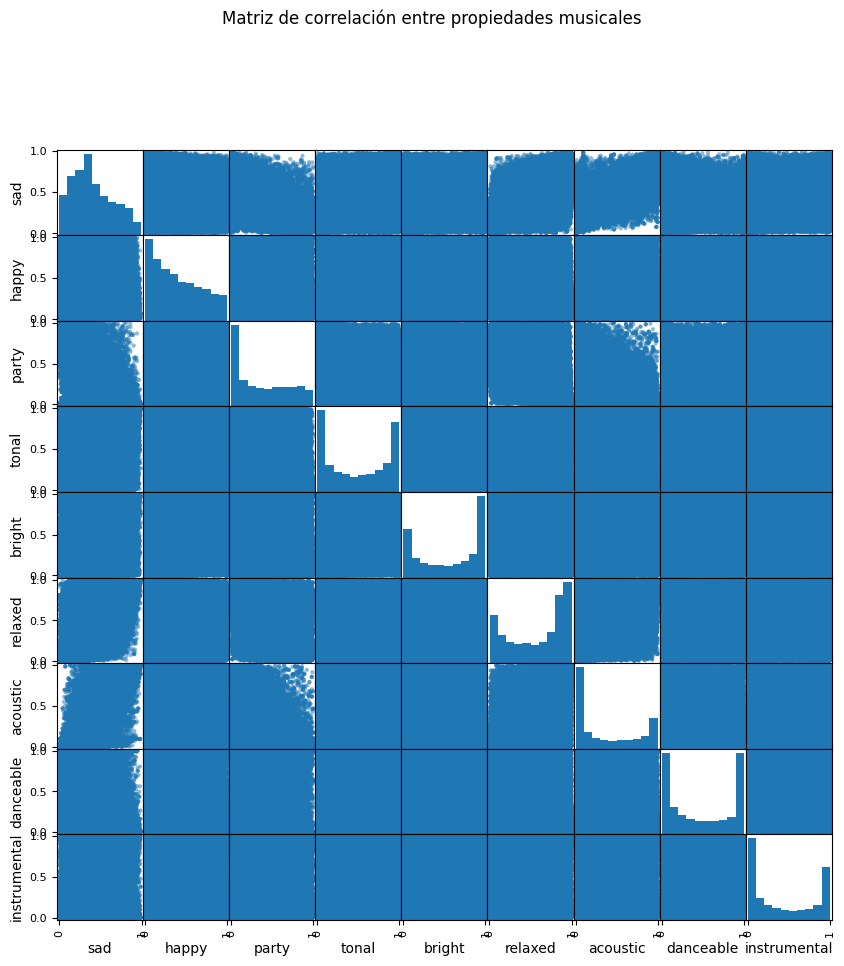

In [ ]:
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix

variables = ['sad', 'happy', 'party', 'tonal', 'bright', 'relaxed', 'acoustic', 'danceable', 'instrumental']

scatter_matrix(df[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales', y=1.02)
plt.show()

A partir del gráfico obtenido, podemos concluir que las correlaciones más distinguibles entre variables son las siguientes:

##### **Correlaciones negativas:**
* `party` vs `sad`
* `party` vs `acoustic`

##### **Correlaciones positivas:**
* `sad` vs `relaxed`
* `sad` vs `acoustic`

Para ver si estas relaciones se cumplen para todas las canciones en general, mostraremos la tabla de correlaciones:

In [ ]:
matriz_correlacion_generica= df[variables].corr()
matriz_correlacion_generica

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.185012,-0.626755,0.254377,0.189686,0.568224,0.787228,-0.457592,0.063506
happy,-0.185012,1.000000,0.185699,0.215150,0.361301,-0.269918,-0.154357,-0.005037,-0.232278
party,-0.626755,0.185699,1.000000,-0.266123,-0.124413,-0.627222,-0.650795,0.498001,-0.156497
tonal,0.254377,0.215150,-0.266123,1.000000,0.483390,-0.037457,0.307872,-0.234657,-0.069057
bright,0.189686,0.361301,-0.124413,0.483390,1.000000,-0.063203,0.223465,-0.118656,-0.156433
relaxed,0.568224,-0.269918,-0.627222,-0.037457,-0.063203,1.000000,0.527843,-0.283551,0.254569
acoustic,0.787228,-0.154357,-0.650795,0.307872,0.223465,0.527843,1.000000,-0.541785,0.018578
danceable,-0.457592,-0.005037,0.498001,-0.234657,-0.118656,-0.283551,-0.541785,1.000000,0.005063
instrumental,0.063506,-0.232278,-0.156497,-0.069057,-0.156433,0.254569,0.018578,0.005063,1.000000


Observando la tabla, vemos que la relación más fuerte es entre `acoustic` y `sad` (0.72). Sin embargo, a pesar de existir otras correlaciones, consideramos que no son tan fuertes como esta, ya que no pasan el +/-0.6.
Pero, estas otras correlaciones que vimos son:
* `sad` vs `party` (negativa)
* `sad` vs `relaxed` (positiva)
* `party` vs `relaxed` (negativa)
* `party` vs `acoustic` (negativa)
* `party` vs `danceable` (positiva)
* `tonal` vs `bright` (positiva)
* `acoustic` vs `danceable` (negativa)



Sin embargo, creemos que los valores genéricos obtenidos pueden llegar a ser influenciados en gran medida por sólo ciertos géneros, ya que puede darse el caso de que los datos sean en gran parte de un determinado género, debido a que se obtuvieron del top 50 actual de artistas de cada país. En el siguiente gráfico, observaremos cuánto porcentaje de cada género tenemos en nuestros datos.


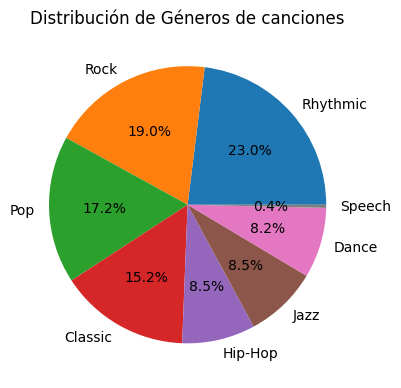

In [ ]:
conteo_generos = df['genre_rosamerica'].value_counts()
plt.figure(figsize=(4.5,4.5))
plt.pie(conteo_generos, labels=conteo_generos.index, autopct='%1.1f%%', startangle=360)
plt.title("Distribución de Géneros de canciones")
plt.show()

Además, agregamos la siguiente tabla para conocer exactamente la cantidad de canciones por género.

In [ ]:
tabla_conteo_generos = df['genre_rosamerica'].value_counts().reset_index()
tabla_conteo_generos.columns = ['Género', 'Cantidad']
tabla_conteo_generos

,Género,Cantidad
0,Rhythmic,3740
1,Rock,3079
2,Pop,2796
3,Classic,2464
4,Hip-Hop,1387
5,Jazz,1383
6,Dance,1333
7,Speech,59


Como se puede ver en el gráfico, es correcto decir que el análisis de correlación anterior se ve influenciado por los géneros más representados: Rhythmic, Pop y en menor medida Rock (estos 3 en conjunto constituyen el 73.3% de los datos). Es decir, las correlaciones observadas anteriormente están predominantemente impulsadas por esos géneros.

Esto también se puede ver en la tabla presentada, donde notamos que Classic, Dance y Jazz son los géneros con menor cantidad de canciones.

Dada esta situación, podríamos decir que la matriz general refleja las tendencias de los géneros que actualmente son más populares. Sin embargo, con respecto a otros géneros menos representados, este análisis general realizado podría no ser suficiente.

Por lo anterior, para obtener un análisis más profundo  y observar características de cada estilo musical en particular, vamos a realizar este mismo gráfico pero para cada género de la variable `genre_rosamerica`:

#### Género 'Pop'

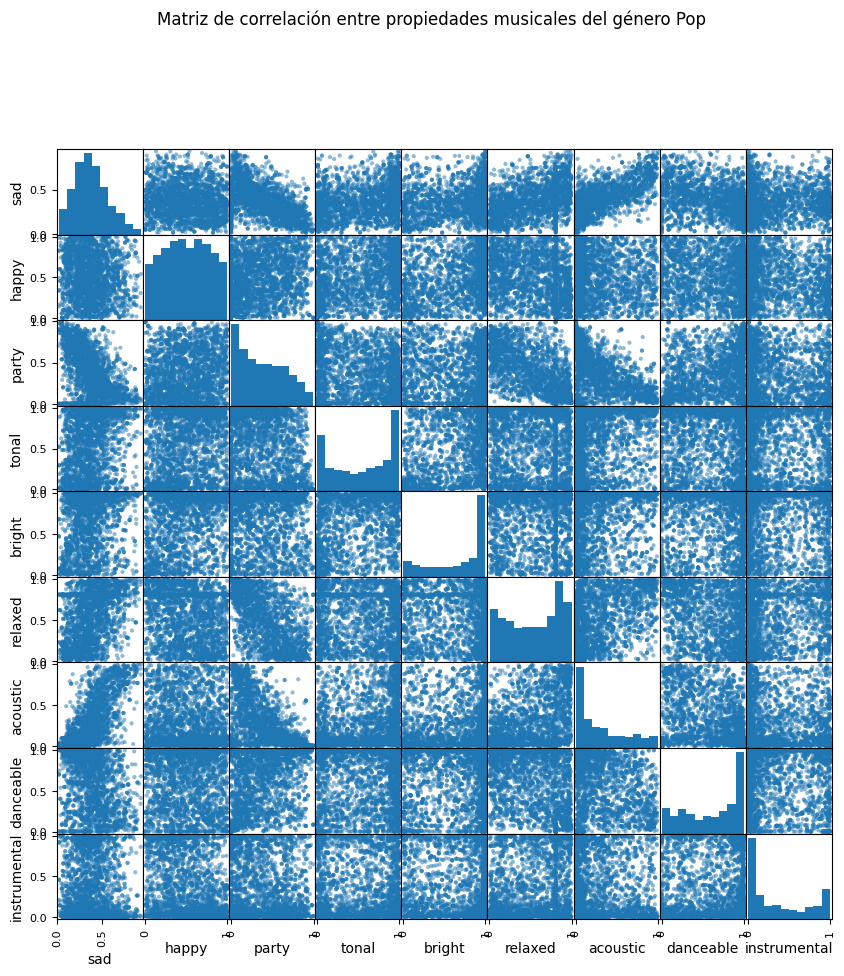

In [ ]:
df_pop = df[df['genre_rosamerica'] == 'Pop']

scatter_matrix(df_pop[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales del género Pop', y=1.02)
plt.show()

Observando lo graficado para el género 'Pop', creemos que existe una correlación positiva fuerte entre las variables `sad` y `acoustic`.

Además, podemos notar que existe una *correlación negativa* entre las variables:
* `party` vs `sad`
* `party` vs `acoustic`
* `party` vs `relaxed`


La última relación, debido a que no es significativa, vamos a corroborarla mediante el cálculo del coeficiente de correlación de Pearson:
* Un valor cercano a ***+1*** indica una ***fuerte correlación positiva***.
* Un valor cercano a ***0*** indica ***poca o nula correlación lineal***.
* Un valor cercano a ***-1*** indica una ***fuerte correlación negativa***.

In [ ]:
matriz_correlacion_pop= df_pop[variables].corr()
matriz_correlacion_pop

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.064832,-0.532252,0.316625,0.234761,0.393769,0.726962,-0.354964,-0.037711
happy,-0.064832,1.000000,0.158875,0.227996,0.303922,-0.207764,-0.048482,-0.076115,-0.266794
party,-0.532252,0.158875,1.000000,-0.247367,-0.085515,-0.615745,-0.490968,0.336946,-0.145576
tonal,0.316625,0.227996,-0.247367,1.000000,0.444041,-0.056751,0.352399,-0.101289,-0.111887
bright,0.234761,0.303922,-0.085515,0.444041,1.000000,-0.048197,0.214588,-0.043802,-0.094277
relaxed,0.393769,-0.207764,-0.615745,-0.056751,-0.048197,1.000000,0.336386,-0.274146,0.187163
acoustic,0.726962,-0.048482,-0.490968,0.352399,0.214588,0.336386,1.000000,-0.383739,-0.119927
danceable,-0.354964,-0.076115,0.336946,-0.101289,-0.043802,-0.274146,-0.383739,1.000000,0.047939
instrumental,-0.037711,-0.266794,-0.145576,-0.111887,-0.094277,0.187163,-0.119927,0.047939,1.000000


Con la tabla, podemos confirmar que existe una correlación positiva moderada-alta entre las variables `sad` y `acoustic`.

También confirmamos que existen correlaciones negativas moderadas-bajas entre la variable `party` y las variables `sad`, `acoustic` y `relaxed`.

Además, con la tabla podríamos indicar las siguientes relaciones:
* Correlación positiva baja entre `relaxed` y `sad`.
* Correlación positiva baja entre `relaxed` y `acoustic`.
* Correlación positiva moderada-baja entre `party` y `danceable`.
* Correlación positiva moderada entre `tonal` y `bright`.
* Correlación negativa moderada-baja entre `acoustic` y `danceable`.
* Correlación positiva moderada-baja entre `tonal` y `acoustic`.

#### Género 'Classic'

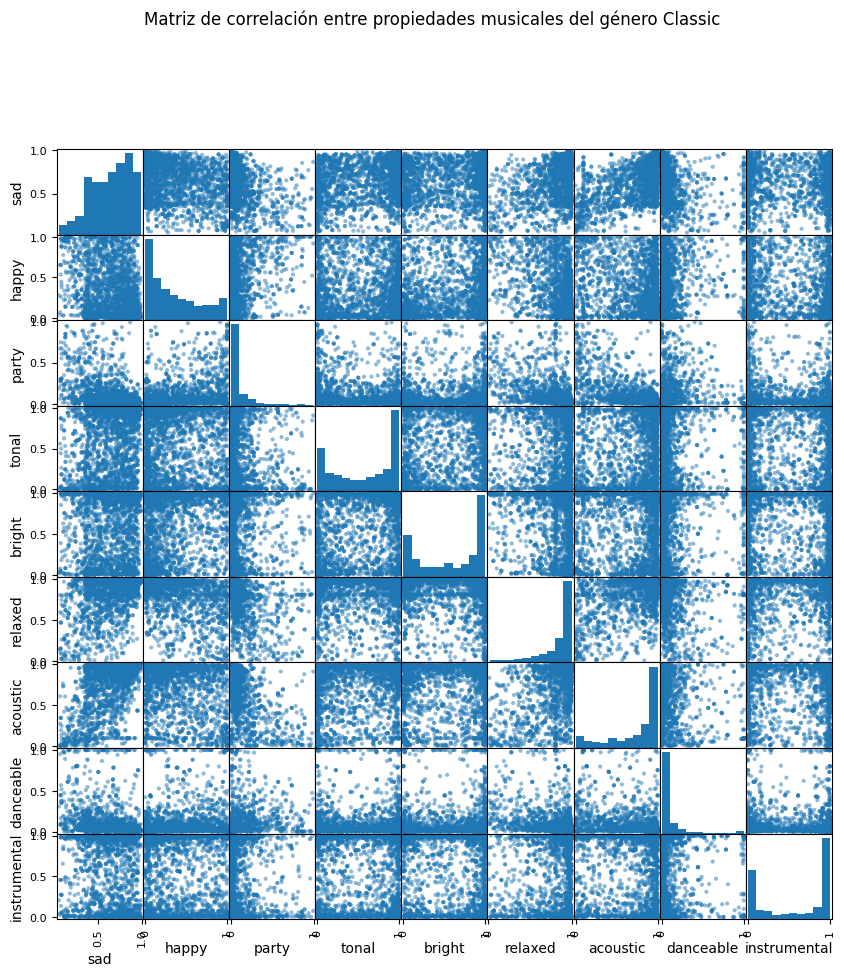

In [ ]:
df_classic = df[df['genre_rosamerica'] == 'Classic']

scatter_matrix(df_classic[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales del género Classic', y=1.02)
plt.show()

Para este género, no encontramos una correlación fuerte entre dos variables (salvo entre `acoustic` y `sad` que consideramos que puede existir una correlación positiva), al haber bastante dispersión entre los pocos puntos de los gráficos.

Sabemos que esto se debe a la poca cantidad de canciones de éste género, recordando que los datos de las canciones se tomaron a partir del top 50 de artistas más populares por país.

De todas formas, para comprobarlo, calcularemos el coeficiente de correlación de las variables:

In [ ]:
matriz_correlacion_classic= df_classic[variables].corr()
matriz_correlacion_classic

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.245762,-0.390566,0.282982,0.083562,0.374081,0.572097,-0.280483,-0.119667
happy,-0.245762,1.000000,0.406435,-0.038103,0.345041,-0.430455,-0.319415,0.186175,-0.225438
party,-0.390566,0.406435,1.000000,-0.250422,0.037886,-0.516125,-0.595333,0.140347,-0.237552
tonal,0.282982,-0.038103,-0.250422,1.000000,0.357395,0.114123,0.335984,-0.034762,0.055897
bright,0.083562,0.345041,0.037886,0.357395,1.000000,-0.139622,0.063524,0.059777,-0.231131
relaxed,0.374081,-0.430455,-0.516125,0.114123,-0.139622,1.000000,0.517768,-0.294878,0.246320
acoustic,0.572097,-0.319415,-0.595333,0.335984,0.063524,0.517768,1.000000,-0.455784,0.031021
danceable,-0.280483,0.186175,0.140347,-0.034762,0.059777,-0.294878,-0.455784,1.000000,-0.070369
instrumental,-0.119667,-0.225438,-0.237552,0.055897,-0.231131,0.246320,0.031021,-0.070369,1.000000


Como se puede ver en la tabla, encontramos las siguientes correlaciones:

* Negativa moderada entre `sad` y `party`
* Positiva alta entre `sad` y `acoustic`
* Negativa moderada-baja entre `sad` y `danceable`
* Negativa moderada entre `sad` e `instrumental`
* Negativa moderada entre `party` y `relaxed`
* Negativa moderada entre `party` y `acoustic`
* Positiva moderada-alta entre `tonal` y `bright`
* Positiva moderada-baja entre `bright` y `acoustic`
* Negativa moderada-baja entre `instrumental` y `acoustic`

#### Género 'Dance'

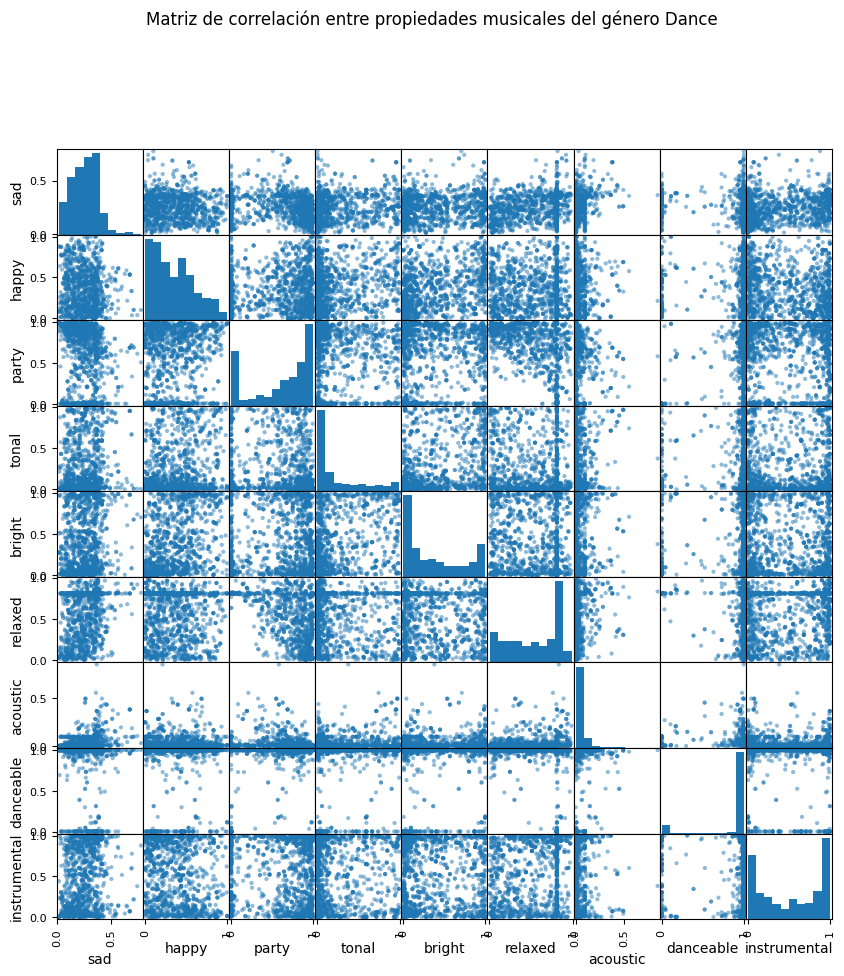

In [ ]:
df_dance = df[df['genre_rosamerica'] == 'Dance']

scatter_matrix(df_dance[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales del género Dance', y=1.02)
plt.show()

A partir de este gráfico, diríamos que no hay una fuerte correlación entre variables del género 'Dance'. Pero, con respecto a las variables `sad` y `bright`, consideramos que podría existir una pequeña correlación entre éstas.
Para analizar mejor las relaciones entre variables, realizaremos una tabla:

In [ ]:
matriz_correlacion_dance= df_dance[variables].corr()
matriz_correlacion_dance

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.079027,-0.209821,0.086178,0.141990,0.310900,0.321035,-0.124444,0.219601
happy,-0.079027,1.000000,0.041955,0.255839,0.389534,-0.001736,0.050861,-0.002435,-0.208795
party,-0.209821,0.041955,1.000000,-0.117562,0.072838,-0.603080,-0.202478,0.531979,-0.118853
tonal,0.086178,0.255839,-0.117562,1.000000,0.387025,-0.105395,0.234910,-0.016131,0.001525
bright,0.141990,0.389534,0.072838,0.387025,1.000000,-0.098215,0.134560,0.043583,-0.044588
relaxed,0.310900,-0.001736,-0.603080,-0.105395,-0.098215,1.000000,0.152059,-0.310200,0.167881
acoustic,0.321035,0.050861,-0.202478,0.234910,0.134560,0.152059,1.000000,-0.155570,-0.008180
danceable,-0.124444,-0.002435,0.531979,-0.016131,0.043583,-0.310200,-0.155570,1.000000,-0.038478
instrumental,0.219601,-0.208795,-0.118853,0.001525,-0.044588,0.167881,-0.008180,-0.038478,1.000000


A partir de la tabla obtenida, podríamos decir que:
- Existe una correlación positiva moderada-baja entre `sad` y `bright`.
- Existe una correlación negativa moderada entre `party` y `relaxed`, y una positiva entre `party` y `danceable`.
- Existe una correlación positiva moderada-baja entre `tonal` y `bright`.

#### Género 'Hip-Hop'

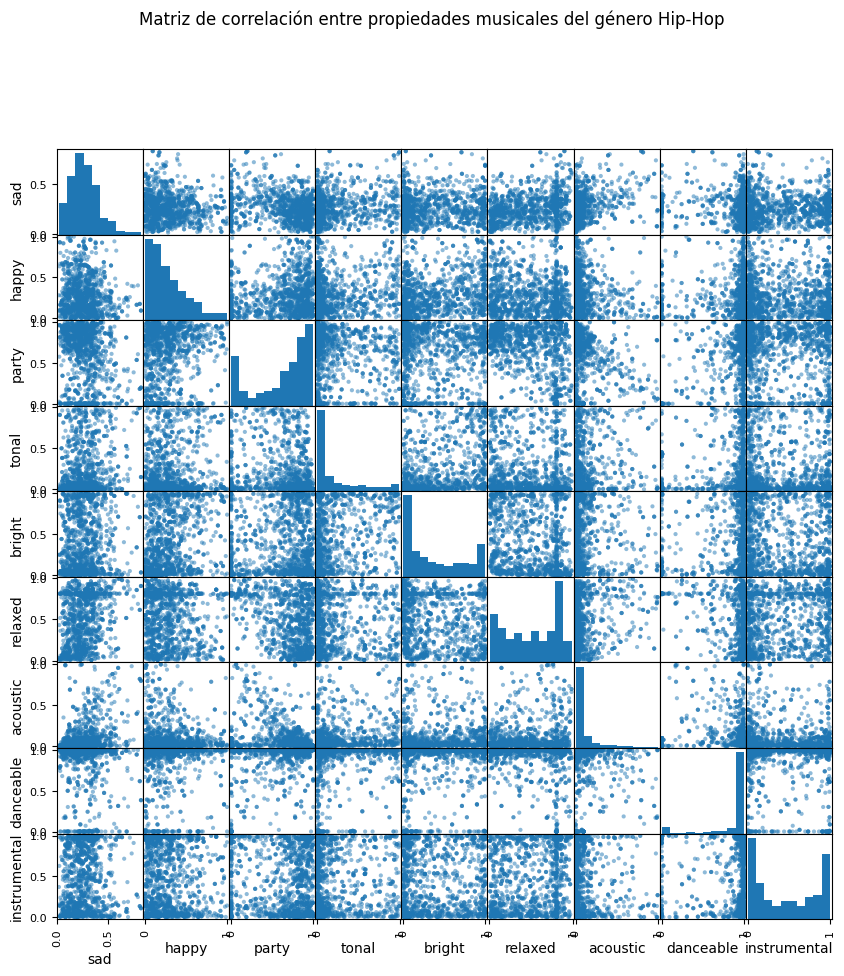

In [ ]:
df_hiphop= df[df['genre_rosamerica'] == 'Hip-Hop']

scatter_matrix(df_hiphop[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales del género Hip-Hop', y=1.02)
plt.show()

Para el género analizado, a simple vista observamos lo siguiente:

##### **Correlaciones positivas**:
* `sad` vs `relaxed`
* `happy` vs `party`
* `tonal` vs `acoustic`

##### **Correlaciones negativas**:
* `sad` vs `instrumental`
* `sad` vs `happy`
* `party` vs `relaxed`
* `party` vs `acoustic`


Pero, al igual que para los anteriores géneros, para corroborar si realmente existe alguna relación entre dichas variables veremos la siguiente tabla:

In [ ]:
matriz_correlacion_hiphop = df_hiphop[variables].corr()
matriz_correlacion_hiphop

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.085650,-0.224815,0.190705,0.062763,0.291984,0.358730,-0.105461,0.047387
happy,-0.085650,1.000000,0.114241,0.161433,0.321139,-0.090457,-0.078218,0.036507,-0.038522
party,-0.224815,0.114241,1.000000,-0.117259,0.068980,-0.462674,-0.257127,0.511509,-0.029932
tonal,0.190705,0.161433,-0.117259,1.000000,0.402348,-0.170256,0.241062,0.011671,-0.050953
bright,0.062763,0.321139,0.068980,0.402348,1.000000,-0.238165,0.098889,0.035339,-0.049063
relaxed,0.291984,-0.090457,-0.462674,-0.170256,-0.238165,1.000000,0.091474,-0.291730,0.171485
acoustic,0.358730,-0.078218,-0.257127,0.241062,0.098889,0.091474,1.000000,-0.156967,-0.118409
danceable,-0.105461,0.036507,0.511509,0.011671,0.035339,-0.291730,-0.156967,1.000000,-0.025026
instrumental,0.047387,-0.038522,-0.029932,-0.050953,-0.049063,0.171485,-0.118409,-0.025026,1.000000


A partir de la tabla, podemos concluir que sí existe una correlación negativa entre `party` y `relaxed`, aunque esta es moderada. Al igual que existe una correlación positiva entre `tonal` y `acoustic`, pero esta es aún menor.

Pero, en la tabla observamos que existe una gran correlación positiva entre `party` y `danceable`, la cual no habíamos notado en el gráfico anterior.

Finalmente, observamos que también existe una moderada correlación negativa entre `danceable` e `instrumental`.


#### Género 'Jazz'

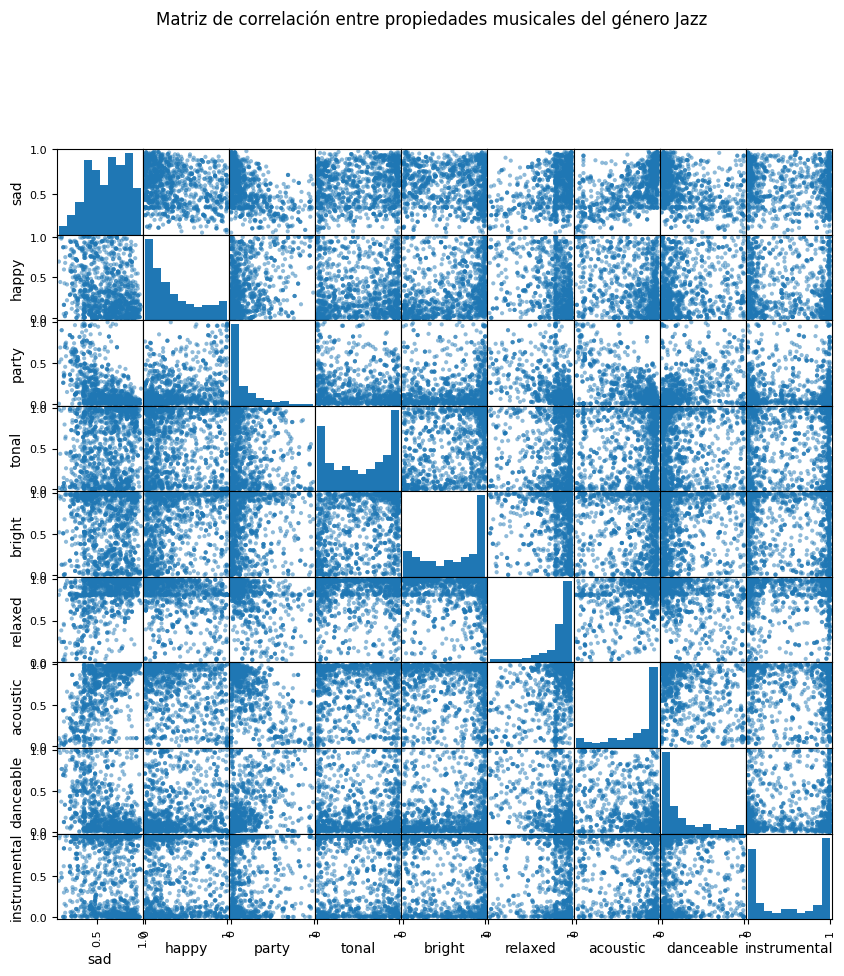

In [ ]:
df_jazz= df[df['genre_rosamerica'] == 'Jazz']

scatter_matrix(df_jazz[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales del género Jazz', y=1.02)
plt.show()

Únicamente viendo el gráfico, podríamos llegar a sacar las siguientes conclusiones:

**Correlaciones negativas**:
* `sad` vs `happy`
* `sad` vs `instrumental`
* `party` vs `relaxed`
* `danceable` vs `relaxed`

**Correlaciones positivas**:
* `sad` vs `relaxed`
* `sad` vs `acoustic`
* `party` vs `danceable`
* `bright` vs `danceable`


Sin embargo, creemos que los valores de estas correlaciones serán bajos, ya que no notamos una fuerte tendencia o linealidad en los gráficos. Además, es importante considerar que se poseen pocas muestras de canciones de Jazz, a diferencia de otros géneros más poblados, lo cual (como se dijo anteriormente), podría deberse a las características de los datos obtenidos, y esto podría llevar a que los resultados obtenidos para este género no sean completamente representativos.

In [ ]:
matriz_correlacion_jazz = df_jazz[variables].corr()
matriz_correlacion_jazz

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.301349,-0.560885,0.166008,-0.070760,0.411802,0.617159,-0.447790,-0.198047
happy,-0.301349,1.000000,0.396953,0.023483,0.262597,-0.351832,-0.346014,0.175035,-0.097205
party,-0.560885,0.396953,1.000000,-0.210733,0.077151,-0.489202,-0.628030,0.412794,-0.025528
tonal,0.166008,0.023483,-0.210733,1.000000,0.376965,0.090046,0.136444,0.025354,0.051678
bright,-0.070760,0.262597,0.077151,0.376965,1.000000,-0.121187,-0.050491,0.154480,-0.135663
relaxed,0.411802,-0.351832,-0.489202,0.090046,-0.121187,1.000000,0.445469,-0.423918,0.027001
acoustic,0.617159,-0.346014,-0.628030,0.136444,-0.050491,0.445469,1.000000,-0.468764,-0.162639
danceable,-0.447790,0.175035,0.412794,0.025354,0.154480,-0.423918,-0.468764,1.000000,0.085515
instrumental,-0.198047,-0.097205,-0.025528,0.051678,-0.135663,0.027001,-0.162639,0.085515,1.000000


Observando la tabla, podemos confirmar que, de forma moderada/moderada-baja, existen las siguientes correlaciones:
* `sad` vs `happy` (negativa)
* `sad` vs `relaxed` (positiva)
* `sad` vs `acoustic` (positiva)
* `party` vs `relaxed` (negativa)
* `party` vs `danceable` (positiva)
* `relaxed` vs `danceable` (negativa)
* `acoustic` vs `instrumental` (negativa)
* `danceable` vs `bright` (positiva)

Además, se observó que también existe una correlación negativa entre `sad` e `instrumental`, aunque esta se considera moderada-baja. Y una moderada entre `tonal` y `bright`.

#### Género Rythmic

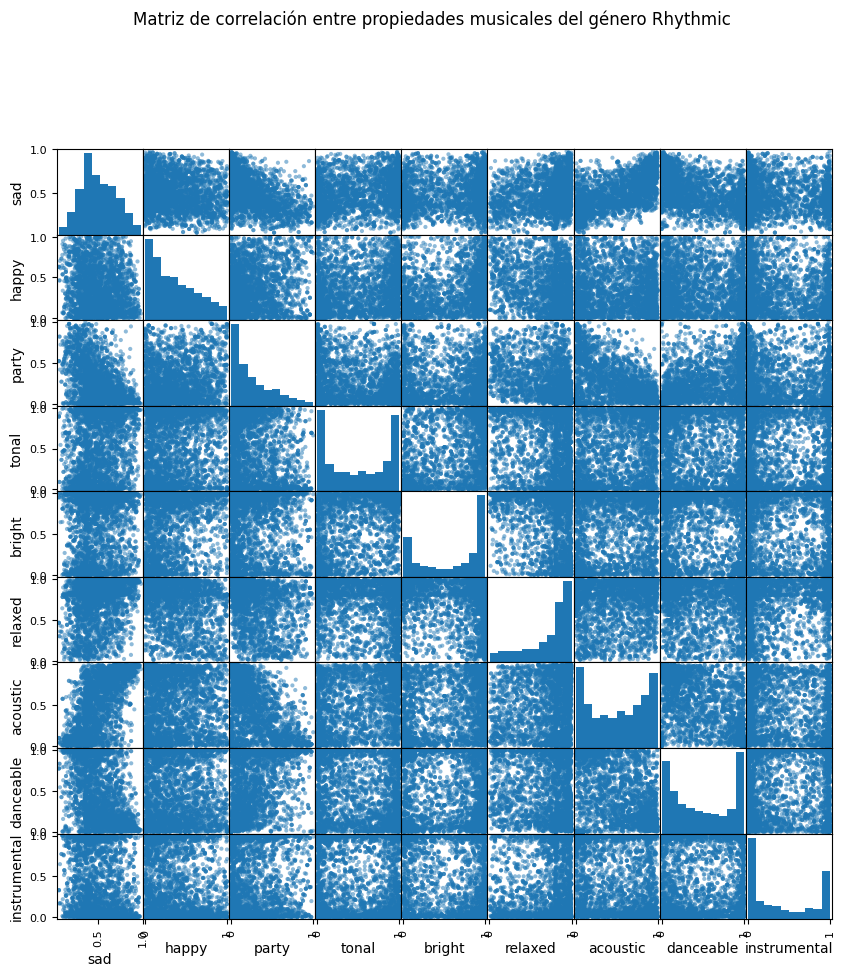

In [ ]:
df_rhythmic= df[df['genre_rosamerica'] == 'Rhythmic']

scatter_matrix(df_rhythmic[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales del género Rhythmic', y=1.02)
plt.show()

A partir del gráfico, podríamos obtener las siguientes conclusiones:

**Correlaciones negativas**:
* `sad` vs `party`
* `party` vs `acoustic`

**Correlaciones positivas**:
* `sad` vs `acoustic`
* `happy` vs `bright`
* `party` vs `danceable`
* `tonal` vs `bright`

In [ ]:
matriz_correlacion_rhythmic = df_rhythmic[variables].corr()
matriz_correlacion_rhythmic

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.124218,-0.476251,0.279791,0.157002,0.236953,0.625232,-0.470767,-0.219961
happy,-0.124218,1.000000,0.206898,0.261335,0.401900,-0.320999,-0.001485,-0.067093,-0.246392
party,-0.476251,0.206898,1.000000,-0.188771,-0.026138,-0.361501,-0.481244,0.473510,-0.002234
tonal,0.279791,0.261335,-0.188771,1.000000,0.537995,-0.236348,0.390378,-0.289987,-0.221814
bright,0.157002,0.401900,-0.026138,0.537995,1.000000,-0.295882,0.303404,-0.217073,-0.352958
relaxed,0.236953,-0.320999,-0.361501,-0.236348,-0.295882,1.000000,0.141865,-0.129167,0.189031
acoustic,0.625232,-0.001485,-0.481244,0.390378,0.303404,0.141865,1.000000,-0.527824,-0.300294
danceable,-0.470767,-0.067093,0.473510,-0.289987,-0.217073,-0.129167,-0.527824,1.000000,0.180338
instrumental,-0.219961,-0.246392,-0.002234,-0.221814,-0.352958,0.189031,-0.300294,0.180338,1.000000


Luego de ver la tabla, podríamos decir:

**Correlaciones negativas**:
* `sad` vs `party`
* `party` vs `acoustic`

**Correlaciones positivas**:
* `sad` vs `acoustic`
* `happy` vs `bright`
* `party` vs `danceable`
* `tonal` vs `bright`


Además, una relación que no habíamos observado es la correlación positiva entre `tonal` y `acoustic`. Y la correlación negativa entre `danceable` y `acoustic`.

#### Género 'Rock'

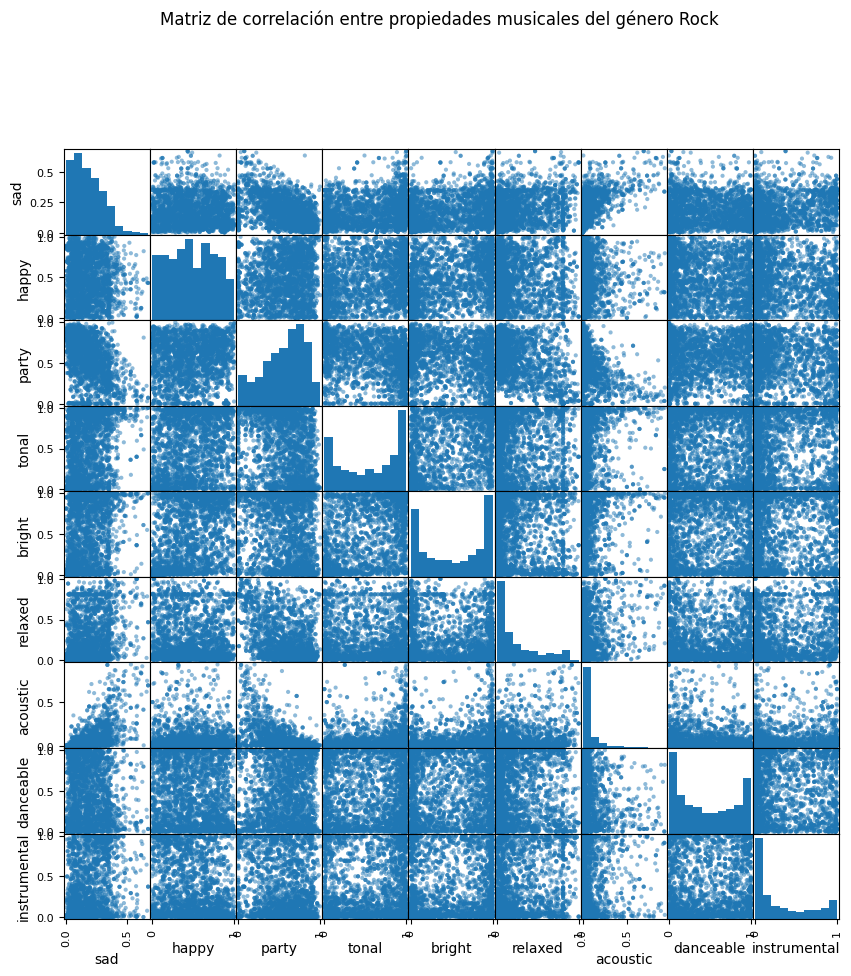

In [ ]:
df_rock= df[df['genre_rosamerica'] == 'Rock']

scatter_matrix(df_rock[variables], figsize=(10, 10))

plt.suptitle('Matriz de correlación entre propiedades musicales del género Rock', y=1.02)
plt.show()

Aquí podemos ver que existen las siguientes correlaciones:

**Correlaciones positivas**:
* `sad` vs `tonal`
* `sad` vs `bright`
* `sad` vs `acoustic`


**Correlaciones negativas**:
* `party` vs `relaxed`


In [ ]:
matriz_correlacion_rock = df_rock[variables].corr()
matriz_correlacion_rock

,sad,happy,party,tonal,bright,relaxed,acoustic,danceable,instrumental
sad,1.000000,-0.039992,-0.489740,0.241007,0.249395,0.309520,0.602313,-0.088313,0.290147
happy,-0.039992,1.000000,0.089705,0.314762,0.396664,-0.064795,-0.023424,-0.088160,-0.181047
party,-0.489740,0.089705,1.000000,-0.278387,-0.165501,-0.520412,-0.486866,0.042144,-0.220143
tonal,0.241007,0.314762,-0.278387,1.000000,0.501713,-0.035788,0.214766,-0.041613,0.009287
bright,0.249395,0.396664,-0.165501,0.501713,1.000000,-0.078436,0.241301,-0.005205,0.027422
relaxed,0.309520,-0.064795,-0.520412,-0.035788,-0.078436,1.000000,0.273793,0.064881,0.272442
acoustic,0.602313,-0.023424,-0.486866,0.214766,0.241301,0.273793,1.000000,-0.136028,0.153723
danceable,-0.088313,-0.088160,0.042144,-0.041613,-0.005205,0.064881,-0.136028,1.000000,0.089829
instrumental,0.290147,-0.181047,-0.220143,0.009287,0.027422,0.272442,0.153723,0.089829,1.000000


Además, observando la tabla podríamos decir que también existen las siguientes correlaciones:
* `party` vs `instrumental` (negativa)
* `tonal` vs `bright` (positiva)
* `relaxed` vs `instrumental` (positiva)

#### Conclusiones sobre el análisis de correlaciones

#### *Limitaciones sobre los géneros*
Es importante tener en cuenta que la variable utilizada para los análisis de correlaciones entre propiedades de canciones, fue genre_rosamerica. La cual consideramos que se trataba de la clasificación de género más acorde y representativa para las canciones. Sin embargo, también creemos que, al contener sólo 7 géneros (Pop, Rock, Rhythmic, Jazz, Classic, Dance y Hip-Hop), se presenta una limitación importante para el análisis. El conjunto de géneros se vuelve muy limitado y podría sesgar la representación de la música, en gran parte debido a que faltan otros géneros como Folk, Reggae, Reggaetón, Cumbia, Metal, Electrónica, etc. Esto significa que lo que realizaremos a futuro estará dentro del espectro de géneros existentes (los analizados para la columna genre_rosamerica). Además, cabe aclarar que no se podrán generalizar las conclusiones obtenidas, especialmente por lo que nombramos antes sobre la proporción de los géneros representados en nusetras canciones.

#### *Conclusiones detalladas por género*

##### **Pop**
La correlación positiva entre `sad` y `acoustic` nos sugiere que las canciones más tristes de éste género suelen ser más acústicas, como por ejemplo baladas.

La correlación negativa entre `party` con las variables `sad`, `acoustic` y `relaxed`, confirma que las canciones de fiesta en el pop son lo opuesto a las tranquilas o tristes.

La corelación entre `party` y `danceable` es positiva, pero no es tan fuerte como en otros géneros, indicando que el Pop puede considerarse `party` sin necesariamente ser bailable.

##### **Classic**
Para este género podríamos decir que, en base a las correlaciones que encontramos, concluimos que las canciones clásicas más tristes suelen ser más acústicas y no tienen ritmo de fiesta. Además, en base a la correlación negativa obtenida entre `instrumental` y `acoustic`, podríamos decir que las canciones con alta instrumentación no necesariamente son acústicas.

##### **Dance**
Dado el coeficiente de correlación entre `party` y `danceable`, al igual que en otros géneros, se confirma que la música de fiesta y la música bailable pueden considerarse sinónimos. Por ello, si una canción es clasificada como de fiesta o con alto valor de la característica party, hay altas probabilidades de que también sea bailable o tener alto danceable.

##### **Hip-Hop**
La correlación negativa entre `danceable` e `instrumental` nos sugiere que los temas más bailables de este género, tienden a tener voz (siendo menos instrumentales), mientras que las pistas instrumentales suelen ser menos adecuadas para bailar.
También, al ver una correlación positiva fuerte entre `party` y `danceable`, podemos confirmar que las canciones más energéticas de este género, son consideradas más bailables.

##### **Jazz**
Las correlaciones positivas entre `sad` y `relaxed`, y entre `sad` y `acoustic` son un rasgo definitorio, indicando que el Jazz más triste es generalmente relajado y con predominio de instrumentos o sonidos acústicos.
Sin embargo, como se nombró anteriormente, los datos obtenidos para este género no los consideramos tan confiables ya que el DataFrame posee muy pocas canciones del mismo en comparación con el resto de los géneros.

##### **Rhythmic**
Dada la correlación positiva entre `happy` y `bright`, se podría decir que las canciones más felices de este género suelen tener características de sonidos más ""brillantes"", más agudos.
Por otro lado, la correlación negativa entre `party` y `acoustic` reafirman el pensamiento de que las canciones de fiesta de este género son principalmente producidas con elementos electrónicos y no tan acústicos o tranquilos.

##### **Rock**
Se conoce que el rock es un genero más complejo y diverso, esto se puede observar en sus correlaciones.
Por ejemplo, para el caso de la alta correlación negativa entre `party` y `relaxed`, podríamos decir que el rock más de "fiesta" es lo opuesto a un rock más tranquilo (por ejemplo rock and roll vs baladas).

Al igual que con el Pop, la correlación positiva entre `sad` y `acoustic` podría indicar que las canciones tristes de este género también suelen ser más acústicas.

#### *Análisis genérico de correlaciones*
Teniendo en cuenta lo analizado previamente, opinamos que para un futuro, en caso de ser necesario identifica run género en base a las correlaciones entre sus propiedades, conviene utilizar las que presentan un coeficiente de correlación alto (por encima de 0.70 o -0.70), ya que de esta manera se asegura utilizar un rasgo "único" de cada genéro, porque como vimos anteriormente, en muchos géneros se repiten ciertas correlaciones, lo que las hace poco distintivas.



---


### Análisis de propiedades
En este apartado analizaremos los valores más altos de cada propiedad, obteniendo un top 100 de canciones en base a ello. Para luego observar qué generos destacan entre estas canciones.

Al final del cálculo de todas las propiedades, realizaremos un análisis general.

#### *Propiedad happy*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_happy = df.sort_values(by='happy', ascending=False).head(100)

conteo_generos_top100_happy = df_ordenado_happy['genre_rosamerica'].value_counts()
conteo_generos_top100_happy

,count
genre_rosamerica,
Classic,37
Pop,19
Jazz,15
Rhythmic,13
Rock,7
Dance,4
Speech,3
Hip-Hop,2


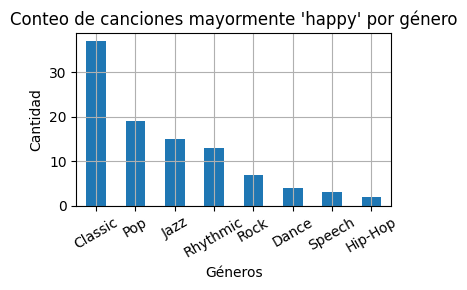

In [ ]:
conteo_generos_top100_happy.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'happy' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_happy = df_ordenado_happy['decada'].value_counts().sort_index()
conteo_decadas_top100_happy

,count
decada,
1930,1
1960,9
1970,1
1980,10
1990,23
2000,37
2010,12
2020,7


#### *Propiedad sad*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_sad = df.sort_values(by='sad', ascending=False).head(100)

conteo_generos_top100_sad = df_ordenado_sad['genre_rosamerica'].value_counts()
conteo_generos_top100_sad

,count
genre_rosamerica,
Classic,73
Jazz,17
Rhythmic,10


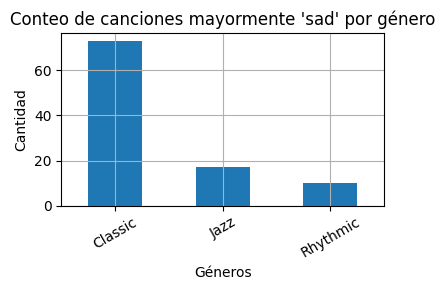

In [ ]:
conteo_generos_top100_sad.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'sad' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_sad = df_ordenado_sad['decada'].value_counts().sort_index()
conteo_decadas_top100_sad

,count
decada,
1950,1
1960,8
1970,5
1980,3
1990,21
2000,38
2010,20
2020,4


#### *Propiedad party*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_party = df.sort_values(by='party', ascending=False).head(100)

conteo_generos_top100_party = df_ordenado_party['genre_rosamerica'].value_counts()
conteo_generos_top100_party

,count
genre_rosamerica,
Dance,46
Hip-Hop,45
Pop,4
Rock,2
Rhythmic,1
Jazz,1
Classic,1


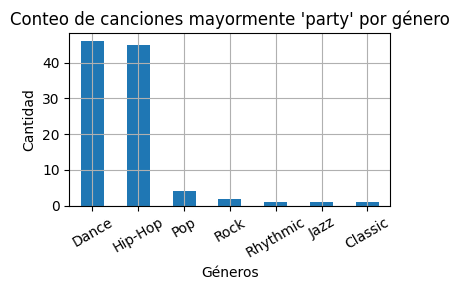

In [ ]:
conteo_generos_top100_party.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'party' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_party = df_ordenado_party['decada'].value_counts().sort_index()
conteo_decadas_top100_party

,count
decada,
1970,3
1990,8
2000,39
2010,40
2020,10


#### *Propiedad tonal*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_tonal = df.sort_values(by='tonal', ascending=False).head(100)

conteo_generos_top100_tonal = df_ordenado_tonal['genre_rosamerica'].value_counts()
conteo_generos_top100_tonal

,count
genre_rosamerica,
Classic,57
Pop,13
Rock,11
Rhythmic,10
Jazz,9


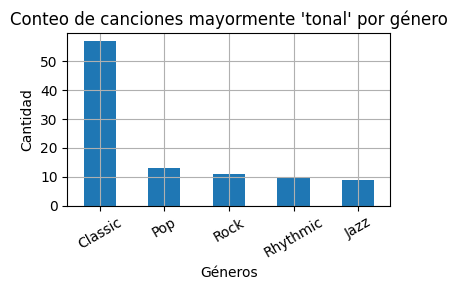

In [ ]:
conteo_generos_top100_tonal.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'tonal' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_tonal = df_ordenado_tonal['decada'].value_counts().sort_index()
conteo_decadas_top100_tonal

,count
decada,
1950,1
1960,1
1970,12
1980,2
1990,25
2000,34
2010,24
2020,1


#### *Propiedad bright*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_bright = df.sort_values(by='bright', ascending=False).head(100)

conteo_generos_top100_bright = df_ordenado_bright['genre_rosamerica'].value_counts()
conteo_generos_top100_bright

,count
genre_rosamerica,
Pop,29
Classic,28
Rhythmic,24
Rock,14
Jazz,4
Hip-Hop,1


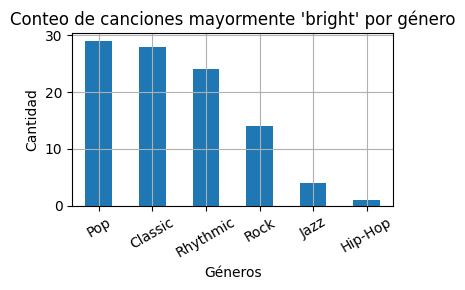

In [ ]:
conteo_generos_top100_bright.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'bright' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_bright = df_ordenado_bright['decada'].value_counts().sort_index()
conteo_decadas_top100_bright

,count
decada,
1940,1
1950,1
1960,4
1970,8
1980,16
1990,10
2000,48
2010,7
2020,5


#### *Propiedad relaxed*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_relaxed = df.sort_values(by='relaxed', ascending=False).head(100)

conteo_generos_top100_relaxed = df_ordenado_relaxed['genre_rosamerica'].value_counts()
conteo_generos_top100_relaxed

,count
genre_rosamerica,
Classic,68
Jazz,19
Rhythmic,8
Pop,3
Speech,2


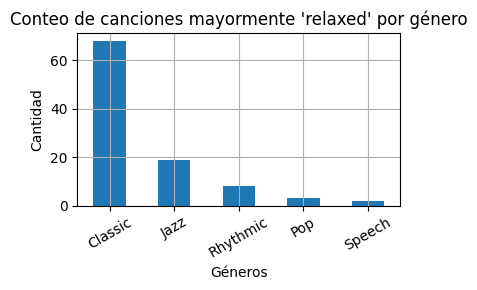

In [ ]:
conteo_generos_top100_relaxed.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'relaxed' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_relaxed = df_ordenado_relaxed['decada'].value_counts().sort_index()
conteo_decadas_top100_relaxed

,count
decada,
1970,3
1990,15
2000,45
2010,32
2020,5


#### *Propiedad acoustic*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_acoustic = df.sort_values(by='acoustic', ascending=False).head(100)

conteo_generos_top100_acoustic = df_ordenado_acoustic['genre_rosamerica'].value_counts()
conteo_generos_top100_acoustic

,count
genre_rosamerica,
Classic,79
Jazz,18
Rhythmic,2
Speech,1


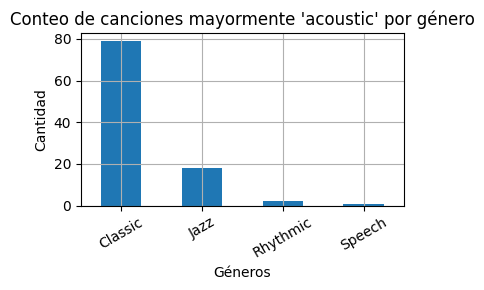

In [ ]:
conteo_generos_top100_acoustic.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'acoustic' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_acoustic = df_ordenado_acoustic['decada'].value_counts().sort_index()
conteo_decadas_top100_acoustic

,count
decada,
1960,7
1970,10
1980,12
1990,23
2000,35
2010,13


#### *Propiedad danceable*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_danceable = df.sort_values(by='danceable', ascending=False).head(100)

conteo_generos_top100_danceable = df_ordenado_danceable['genre_rosamerica'].value_counts()
conteo_generos_top100_danceable

,count
genre_rosamerica,
Dance,50
Hip-Hop,22
Pop,6
Rock,6
Rhythmic,6
Classic,6
Jazz,4


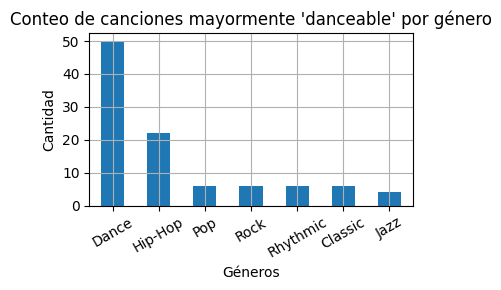

In [ ]:
conteo_generos_top100_danceable.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'danceable' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_danceable = df_ordenado_sad['decada'].value_counts().sort_index()
conteo_decadas_top100_danceable

,count
decada,
1950,1
1960,8
1970,5
1980,3
1990,21
2000,38
2010,20
2020,4


#### *Propiedad instrumental*
Comenzaremos obteniendo el top 100 de canciones para esta propiedad, luego analizaremos qué géneros son los que predominan en este top.

In [ ]:
df_ordenado_instrumental = df.sort_values(by='instrumental', ascending=False).head(100)

conteo_generos_top100_instrumental = df_ordenado_instrumental['genre_rosamerica'].value_counts()
conteo_generos_top100_instrumental

,count
genre_rosamerica,
Classic,67
Rhythmic,17
Jazz,5
Dance,4
Rock,3
Pop,2
Hip-Hop,1
Speech,1


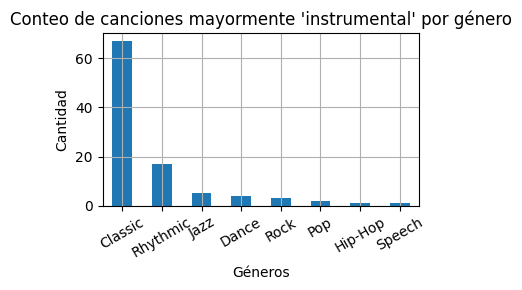

In [ ]:
conteo_generos_top100_instrumental.plot(kind="bar", figsize=(4, 3))
plt.title("Conteo de canciones mayormente 'instrumental' por género")
plt.grid(True)
plt.xlabel("Géneros")
plt.ylabel("Cantidad")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

In [ ]:
conteo_decadas_top100_instrumental = df_ordenado_sad['decada'].value_counts().sort_index()
conteo_decadas_top100_instrumental

,count
decada,
1950,1
1960,8
1970,5
1980,3
1990,21
2000,38
2010,20
2020,4


#### *Observaciones generales*
Para las propiedades mas "festivas" como `happy` o `danceable`, observamos un predominio de los géneros más modernos: Hip-Hop, Dance, Pop y Rhythmic.

Además, notamos que las canciones más tristes están vinculadas a géneros como Rhythmic, Jazz y Classic, mostrando que la percepción de "tristeza" se asocia más a géneros tradicionales o con mayor expresividad.

Con respecto a las décadas, observamos que las más recientes tienen una representación en casi todas las propiedades, lo cual puede estar sesgado por la cantidad de canciones más actuales de nuestro set de datos.

Ahora, considerando lo visto anteriormente, cabe destacar que la clasificación de Rhythmic para la propiedad `genre_rosamerica`, no posee únicamente canciones más actuales, sino que también presenta una cierta cantidad de canciones más antiguas. Creemos que es porque este género es bastante amplio, conteniendo canciones con un fuerte énfasis en el ritmo y la energía..



---

### Análisis de características por género

En esta sección vamos a explorar las características de las canciones (por ejemplo 'happy', 'danceable' y 'sad') por género, utilizando un promedio de las mismas.

#### ***Explorando Pop...***

In [ ]:
# Dejamos en el DataFrame df_pop solo las canciones cuyo genre_rosamerica sea Pop
df_pop = df[(df["genre_rosamerica"] == "Pop")]

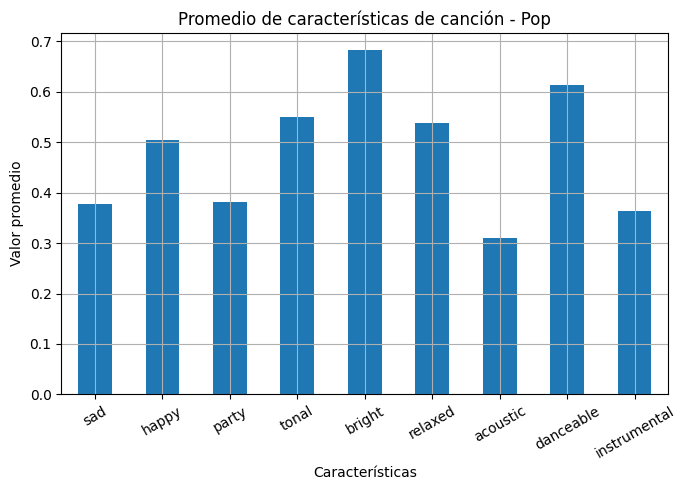

In [ ]:
# Hacemos el grafico
df_pop[variables].mean().plot(kind="bar", figsize=(7, 5))
plt.title("Promedio de características de canción - Pop")
plt.grid(True)
plt.xlabel("Características")
plt.ylabel("Valor promedio")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

Analizando el gráfico anterior, podemos reconocer que la característica con el valor más alto para el género Pop es `danceable`, mientras que la que tiene menor valor es `acoustic`.

Con las demás características, se puede notar que sus valores son bastante variables entre sí y se mantienen dentro de un rango, es decir, ninguna tiene un valor muy bajo o muy alto.

Nos ha sorprendido que, siendo Pop, tenga valores bastante bajos de `happy` y `party`, pensabamos que tiene valores más altos de estas características.

A modo de entender mejor, hacemos un gráfico de cajas en vez de uno de barras.

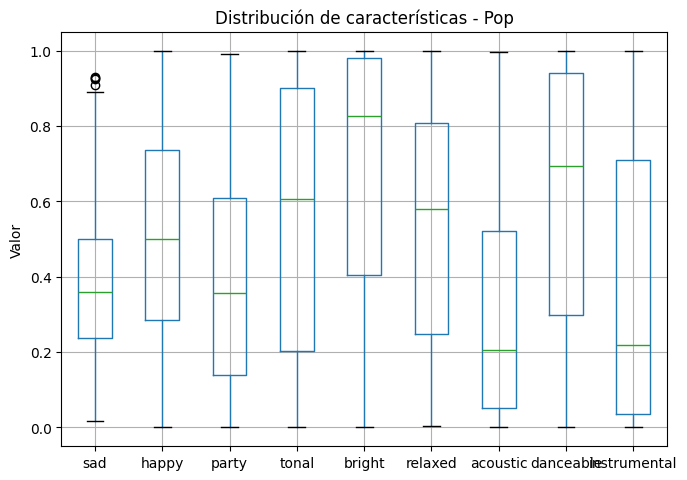

In [ ]:
plt.figure(figsize=(7, 5))
plt.title("Distribución de características - Pop")
plt.ylabel("Valor")
plt.xticks(rotation=30)
plt.grid(True)
plt.tight_layout()
df_pop[variables].boxplot()
plt.show()

#### ***Explorando Rock...***

In [ ]:
# Dejamos en el DataFrame df_pop solo las canciones cuyo genre_rosamerica sea Rock
df_rock = df[(df["genre_rosamerica"] == "Rock")]

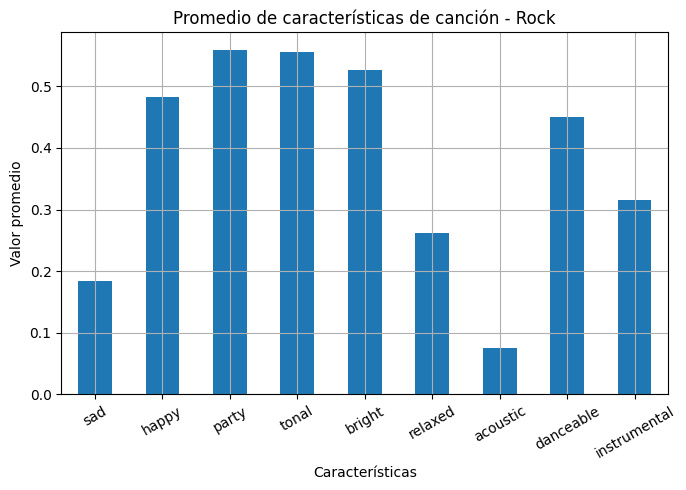

In [ ]:
# Hacemos el grafico
df_rock[variables].mean().plot(kind="bar", figsize=(7, 5))
plt.title("Promedio de características de canción - Rock")
plt.grid(True)
plt.xlabel("Características")
plt.ylabel("Valor promedio")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

Por el lado del Rock, se puede notar varias cosas:
* En general, los valores de las características son bastante bajos: el más alto (`tonal`) marca un valor de 0.47 aproximadamente. El cual es mucho menor que el valor más alto del género Pop (supera 0.7).
* No se destaca una característica con mayor valor por sobre las otras, pero sí la que tiene menor valor: `acoustic`.
* Con lo anterior, se podría suponer que no hay ningún valor representativo de este género. Sin embargo podríamos suponer que la mayoría de canciones de este género, presentarán casi siempre valores más bajos en la variable `acoustic`.

A modo de entender mejor, hacemos un gráfico de cajas en vez de uno de barras.

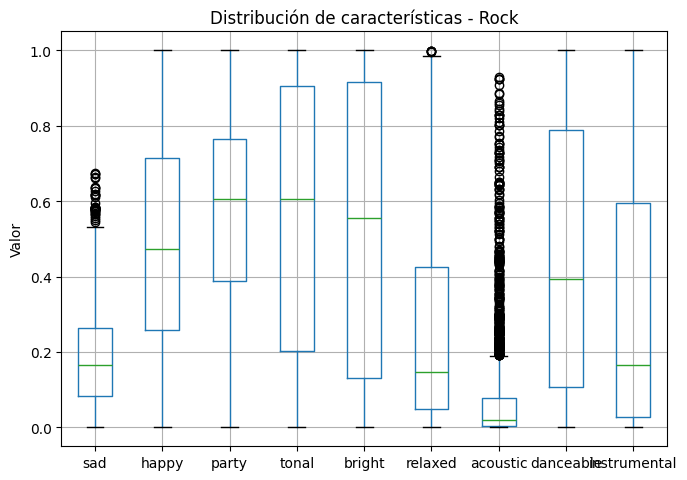

In [ ]:
plt.figure(figsize=(7, 5))
plt.title("Distribución de características - Rock")
plt.ylabel("Valor")
plt.xticks(rotation=30)
plt.grid(True)
plt.tight_layout()
df_rock[variables].boxplot()
plt.show()

#### ***Explorando Dance...***

In [ ]:
# Dejamos en el DataFrame df_pop solo las canciones cuyo genre_rosamerica sea Dance
df_dance = df[(df["genre_rosamerica"] == "Dance")]

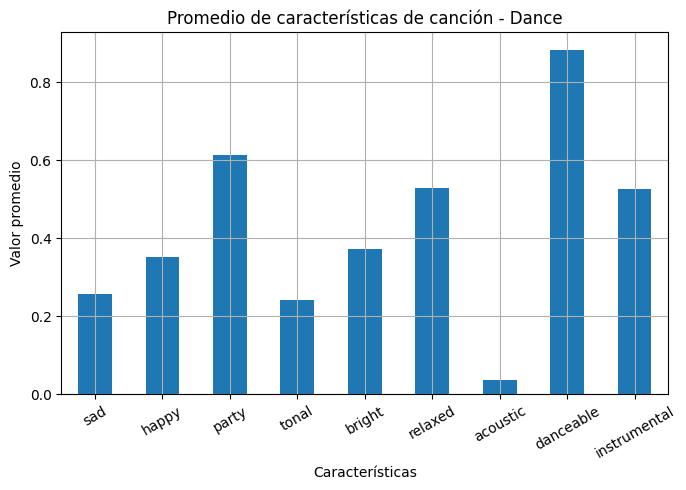

In [ ]:
# Hacemos el grafico
df_dance[variables].mean().plot(kind="bar", figsize=(7, 5))
plt.title("Promedio de características de canción - Dance")
plt.grid(True)
plt.xlabel("Características")
plt.ylabel("Valor promedio")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

Con el género Dance, se puede ver (como era de esperarse) un alto valor de la característica `danceable`, superando el 0.8. Por el otro lado, se ve un bajísimo valor de `acoustic`, el cual no llega siquiera a 0.1.

Con estos valores, podríamos decir que en el género Dance, destaca notablemente la variable `danceable` por sobre las demás. Y a su vez, que la mayoría de las canciones de éste género, no presentarán valores altos en la variable `acoustic`.


A modo de entender mejor, hacemos un gráfico de cajas en vez de uno de barras.

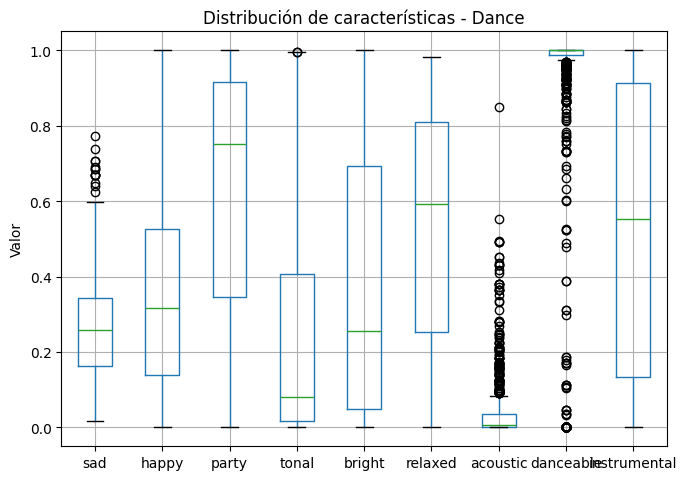

In [ ]:
plt.figure(figsize=(7, 5))
plt.title("Distribución de características - Dance")
plt.ylabel("Valor")
plt.xticks(rotation=30)
plt.grid(True)
plt.tight_layout()
df_dance[variables].boxplot()
plt.show()

#### ***Explorando Rhythmic...***


In [ ]:
# Dejamos en el DataFrame df_rhythmic solo las canciones cuyo genre_rosamerica sea Rhythmic
df_rhythmic = df[(df["genre_rosamerica"] == "Rhythmic")]

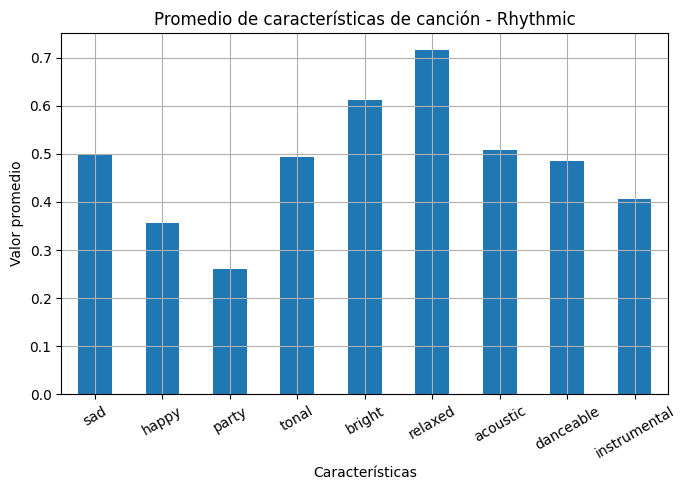

In [ ]:
# Hacemos el grafico
df_rhythmic[variables].mean().plot(kind="bar", figsize=(7, 5))
plt.title("Promedio de características de canción - Rhythmic")
plt.grid(True)
plt.xlabel("Características")
plt.ylabel("Valor promedio")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

Con el gráfico anterior (representando las características del género Rhythmic) pueden sacarse algunas conclusiones:
* Su característica más marcada es `relaxed`, con un valor bastante alto, rozando el 0.8. La segunda característica más marcada es `danceable`.
* Fuera de las dos mencionadas, las demás características presentan valores similares.

Como se vio en uno de los gráficos anteriores que representaba la proporción de canciones según el género ([ver acá](https://colab.research.google.com/drive/1xHxv0dULh7t2Ux6idKMFYMtXYjB7Jecy#scrollTo=Sny5aUqhs8WQ&line=1&uniqifier=1)), Rhythmic es el segundo género más representado en el dataset, por lo que las características mencionadas en este punto que representan al género tienen una alta "confiabilidad".

A modo de entender mejor, hacemos un gráfico de cajas en vez de uno de barras.


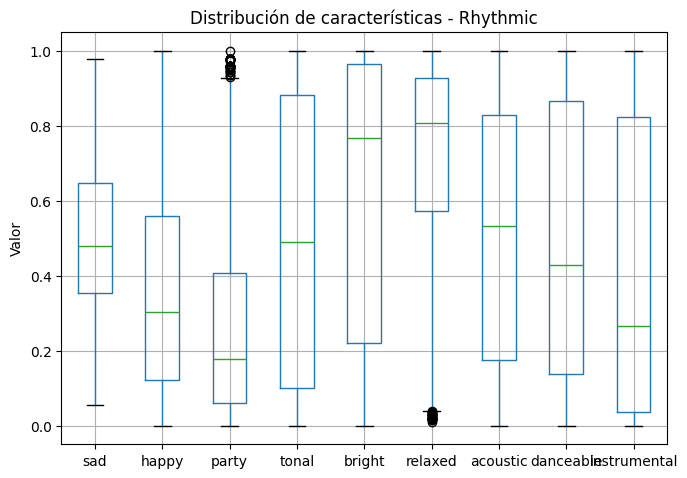

In [ ]:
plt.figure(figsize=(7, 5))
plt.title("Distribución de características - Rhythmic")
plt.ylabel("Valor")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
df_rhythmic[variables].boxplot()
plt.show()

#### ***Explorando Classic...***

In [ ]:
# Dejamos en el DataFrame df_classic solo las canciones cuyo genre_rosamerica sea Classic
df_classic = df[(df["genre_rosamerica"] == "Classic")]

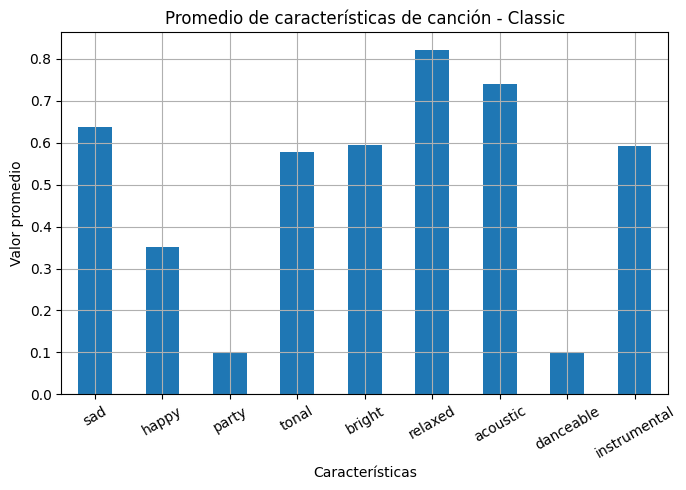

In [ ]:
# Hacemos el grafico
df_classic[variables].mean().plot(kind="bar", figsize=(7, 5))
plt.title("Promedio de características de canción - Classic")
plt.grid(True)
plt.xlabel("Características")
plt.ylabel("Valor promedio")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

Para el género Classic, se obtienen las siguientes conclusiones:
* Como era de esperarse, presenta valores bajos de las características `party` y `danceable`.
* Nos ha sorprendido que el promedio de la característica `happy` es bastante alto para el género. Por el lado de `instrumental`, lo contrario: es bastante bajo para el género.

A modo de entender mejor, hacemos un gráfico de cajas en vez de uno de barras.


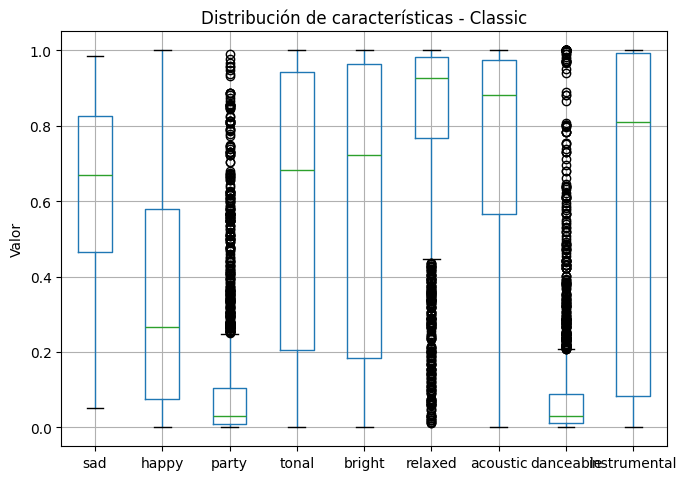

In [ ]:
plt.figure(figsize=(7, 5))
plt.title("Distribución de características - Classic")
plt.ylabel("Valor")
plt.xticks(rotation=30)
plt.grid(True)
plt.tight_layout()
df_classic[variables].boxplot()
plt.show()

#### ***Explorando Hip-Hop...***

In [ ]:
# Dejamos en el DataFrame df_hiphop solo las canciones cuyo genre_rosamerica sea Hip-Hop
df_hiphop = df[(df["genre_rosamerica"] == "Hip-Hop")]

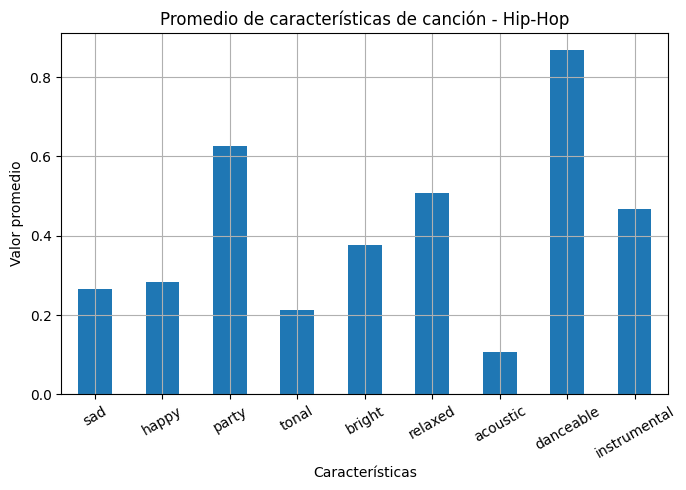

In [ ]:
# Hacemos el grafico
df_hiphop[variables].mean().plot(kind="bar", figsize=(7, 5))
plt.title("Promedio de características de canción - Hip-Hop")
plt.grid(True)
plt.xlabel("Características")
plt.ylabel("Valor promedio")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

Para este género, podemos sacar las siguientes conclusiones:
* Su valor más alto es el de `danceable`, llegando al 0.75 aproximadamente.
* Nos ha sorprendido que la segunda característica con valor más alto sea `relaxed`, ya que no pensaríamos que es una característica representativa del género. Lo mismo para `instrumental`, que ocupa el tercer lugar en las características con valores más altos para Hip-Hop.
* El resto de las características presentan valores bastante similares, con `acoustic` ocupando el lugar de la característica con menor valor, o en este caso menos representativa de Hip-Hop.



A modo de entender mejor, hacemos un gráfico de cajas en vez de uno de barras.


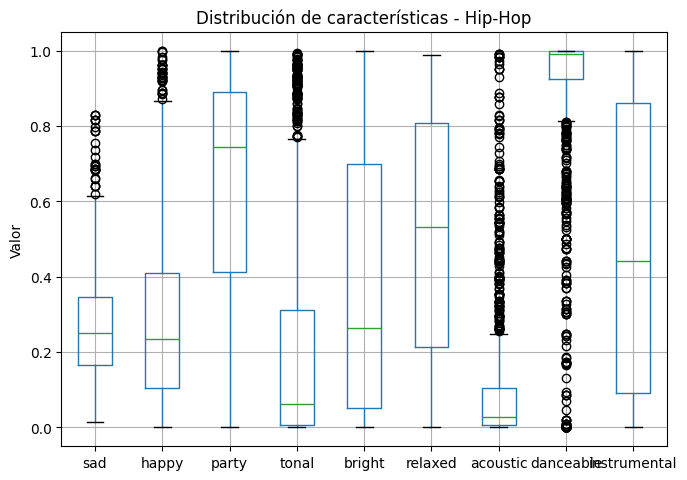

In [ ]:
plt.figure(figsize=(7, 5))
plt.title("Distribución de características - Hip-Hop")
plt.ylabel("Valor")
plt.xticks(rotation=30)
plt.grid(True)
plt.tight_layout()
df_hiphop[variables].boxplot()
plt.show()

#### ***Explorando Jazz...***

In [ ]:
# Dejamos en el DataFrame df_jazz solo las canciones cuyo genre_rosamerica sea Jazz
df_jazz = df[(df["genre_rosamerica"] == "Jazz")]

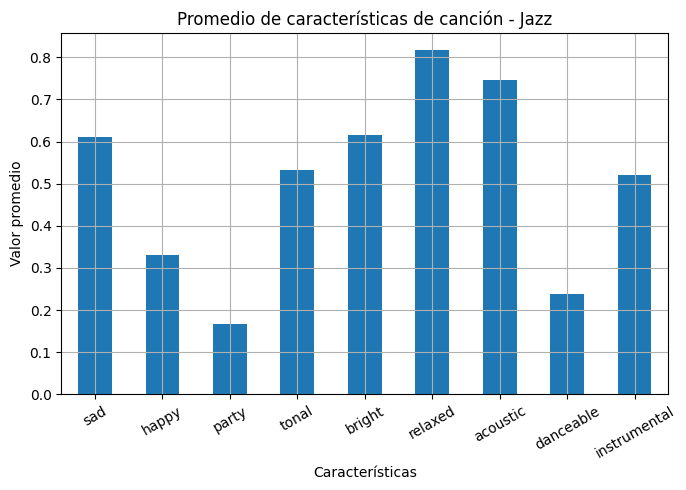

In [ ]:
# Hacemos el grafico
df_jazz[variables].mean().plot(kind="bar", figsize=(7, 5))
plt.title("Promedio de características de canción - Jazz")
plt.grid(True)
plt.xlabel("Características")
plt.ylabel("Valor promedio")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

Por último, por el lado del Jazz, se pueden sacar las siguientes conclusiones:
* Como las características más representativas, tenemos a `sad`, `acoustic` y `relaxed`, siendo esta última la de mayor valor.
* En su contraparte, las características con menor valor para este género son `party` y `danceable`.

Pensamos que esto tiene mucho sentido, ya que el Jazz se caracteriza por canciones tranquilas y poco bailables o de fiesta, es un género más tradicional. Pensamos que, igualmente, podría haber tenido un valor más alto de `happy`. Igualmente, pensamos que esto se puede haber dado por el hecho de que Jazz el segundo género menos representado en el set de canciones, con solo el 4% como se vio en uno de los gráficos anteriores [(ver acá)](https://colab.research.google.com/drive/1xHxv0dULh7t2Ux6idKMFYMtXYjB7Jecy#scrollTo=Sny5aUqhs8WQ&line=1&uniqifier=1).

A modo de entender mejor, hacemos un gráfico de cajas en vez de uno de barras.


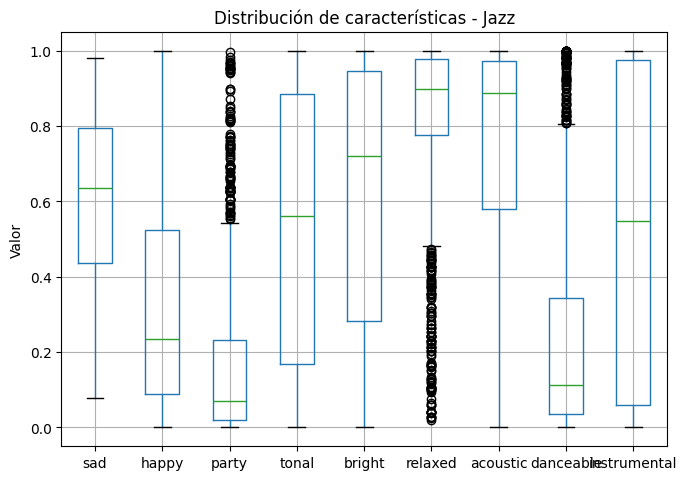

In [ ]:
plt.figure(figsize=(7, 5))
plt.title("Distribución de características - Jazz")
plt.ylabel("Valor")
plt.xticks(rotation=30)
plt.grid(True)
plt.tight_layout()
df_jazz[variables].boxplot()
plt.show()

#### *Observaciones generales*

Como conclusión en general, vamos a armar una tabla consolidando las características cuyo promedio es mayor por cada género, para intentar llegar a la más representativa.

In [ ]:
# Calculamos el promedio de cada caracteristica, por género
df_promedios = df.groupby("genre_rosamerica")[variables].mean()

# Acá vamos a ir guardando los resultados
resultados = []
for genero, fila in df_promedios.iterrows():
    caracteristica_max = fila.idxmax()
    valor_max = fila.max()
    resultados.append([genero, caracteristica_max, valor_max])

# Formamos el Data Frame con la información que queremos
df_resultados = pd.DataFrame(resultados, columns=["Género", "Característica", "Valor"])

df_resultados

,Género,Característica,Valor
0,Classic,relaxed,0.821958
1,Dance,danceable,0.884083
2,Hip-Hop,danceable,0.868114
3,Jazz,relaxed,0.817365
4,Pop,bright,0.682846
5,Rhythmic,relaxed,0.715705
6,Rock,party,0.559668
7,Speech,acoustic,0.792461


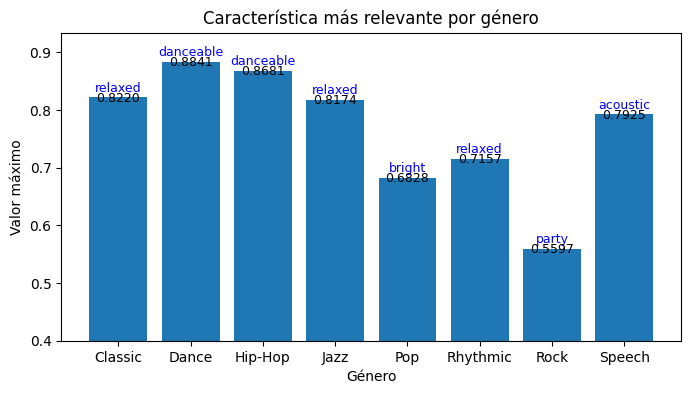

In [ ]:
# Por último, hacemos un gráfico para mostrar las diferencias de valores y características, por género
plt.figure(figsize=(8,4))
plt.bar(df_resultados["Género"], df_resultados["Valor"])

# Mostrar la característica arriba de cada barra
for i, (carac, val) in enumerate(zip(df_resultados["Característica"], df_resultados["Valor"])):
    plt.text(i, val + 0.01, carac, ha="center", fontsize=9, rotation=0, color="blue")

for i, val in enumerate(df_resultados["Valor"]):
    plt.text(i, val + 0.01, f"{val:.4f}", ha="center", va="top", fontsize=9, color="black")

plt.ylabel("Valor máximo")
plt.xlabel("Género")
plt.title("Característica más relevante por género")
plt.xticks(rotation=0)
plt.ylim(0.4, df_resultados["Valor"].max() + 0.05)
plt.show()

---
## *Parte 2B: Planteo de Hipótesis*

### **Hipótesis 1**

**Existe una correlación positiva entre las columnas 'happy' y 'danceable'.**

Creemos que esto se debe a que las canciones que nos hacen sentir felices generalmente también son las que nos invitan a bailar.

Para verificar lo planteado en la hipótesis, podemos analizar de manera numérica y gráfica. Inicialmente haremos el primer caso, donde utilizaremos el coeficiente de correlación de Pearson ya que permite cuantificar la relación entre dos variables.

#### Cálculo de la correlación entre 'happy' y 'danceable'

El coeficiente de correlación de Pearson, nos dará una medida de la fuerza y la dirección de la relación lineal entre ambas variables, de manera que:
* Un valor cercano a ***+1*** indica una ***fuerte correlación positiva***: a medida que los valores de `'happy'` aumentan, los de `'danceable'` tambien lo hacen.
* Un valor cercano a ***0*** indica ***poca o nula correlación lineal***.
* Un valor cercano a ***-1*** indica una ***fuerte correlación negativa*** (lo que refutaría la hipótesis planteada).

A continuación, se calcula la correlación entre estas dos columnas:

In [ ]:
correlacion = df['happy'].corr(df['danceable'])
print(f"Correlación entre 'happy' y 'danceable': {correlacion}")

Correlación entre 'happy' y 'danceable': -0.00503691699450535


Observando el resultado obtenido del cálculo, se podría decir que *no existe una correlación lineal significativa* entre estas dos variables.

Sin embargo, para facilitar la visualización, comprender mejor y verificar este valor obtenido, realizaremos el gráfico de dispersión para analizar esta relación.

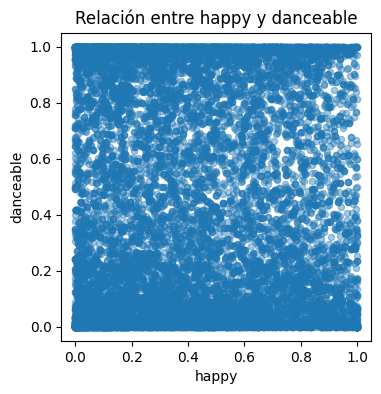

In [ ]:
import matplotlib.pyplot as plt

df.plot(kind="scatter", x="happy", y="danceable", alpha=0.4, figsize=(4, 4))

plt.title("Relación entre happy y danceable")
plt.show()

Al ver el gráfico, podemos terminar de confirmar que no existe una relación directa entre estas dos variables analizadas. Por lo tanto, **refutamos** la hipótesis planteada.



---


### **Hipótesis 2**

**Las canciones con títulos más cortos tienden a tener una mayor puntuación de "party" o "danceable".**

Comúnmente se sospecha que los ítulos cortos y directos podrían ser una característica compartida entre las canciones de pop, reggaeton u otros géneros más "actuales" debido a que muchas veces son diseñadas para ser pegadizas y más bailables.

Para el análisis de esta hipótesis, utilizaremos la columna `'longitud_titulo'` creada anteriormente que contiene la longitud del título de las canciones.

Entonces, a continuación, haremos un proceso similar al anterior para ver la correlación entre la nueva columna y las columnas `'party'` y `'danceable'`:


In [ ]:
correlacion_party = df['longitud_titulo'].corr(df['party'])
correlacion_danceable = df['longitud_titulo'].corr(df['danceable'])

print(f"Correlación entre longitud_titulo y 'party': {correlacion_party}")
print(f"Correlación entre longitud_titulo y 'danceable': {correlacion_danceable}")

Correlación entre longitud_titulo y 'party': -0.05937042826288346
Correlación entre longitud_titulo y 'danceable': -0.05034193119135045


Observando ambos valores, se podría llegar a pensar que la hipótesis se confirma, ya que al tener valores negativos, esto significa que a medida que la longitud del título disminuye, las puntuaciones de las otras columnas aumentan. Sin embargo, debido a que son valores bastante bajos, vamos a corroborar si esto se cumple mediante la visualización de los gráficos de correlación.

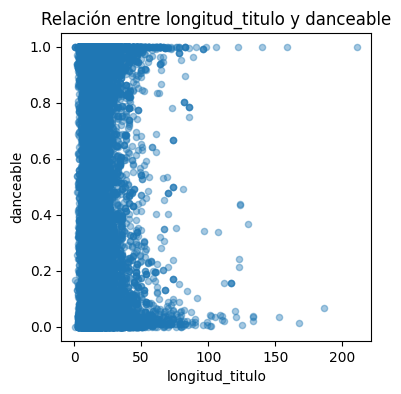

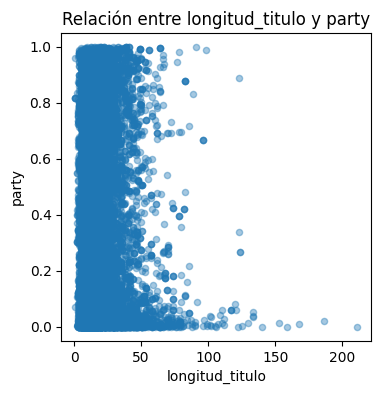

In [ ]:
# Relación entre la longitud del título y la propiedad bailable
df.plot(kind="scatter", x="longitud_titulo", y="danceable", alpha=0.4, figsize=(4, 4))

plt.title("Relación entre longitud_titulo y danceable")
plt.show()

# Relación entre la longitud del título y la propiedad party
df.plot(kind="scatter", x="longitud_titulo", y="party", alpha=0.4, figsize=(4, 4))

plt.title("Relación entre longitud_titulo y party")
plt.show()


A través de estos resultados podríamos decir que la hipótesis no se cumple de manera significativa, ya que los valores de correlación, a pesar de corroborar que hay una relación negativa, son muy cercanos a cero. Esto indica que la correlación lineal es muy débil.

Además, a través de las imágenes podemos ver que no se ve una tendencia descendente que indique que a medida que la longitud del título aumenta, los valores de 'party' o 'danceable' disminuyen.

Es por esto que se podría decir que la hipótesis planteada ***se refuta***.



---


### **Hipótesis 3**

**La duración de las canciones ha disminuido a lo largo de los años.**

También se suele decir que las canciones más actuales son más cortas que las antiguas. Por lo que vamos a comprobar si esto es cierto.
Primero, ignoraremos las filas que poseen el valor 0 en la columna date, ya que podrían distorsionar nuestro análisis. Luego, calcularemos el promedio de duraciones para cada año y lo presentaremos en un gráfico. Esto nos permitirá comprobar si realmente han disminuido las duraciones.

In [ ]:
df_h3 = df[df["date"] != 0]
df_h3 = df_h3.groupby("date")["length"].mean().reset_index()
df_h3

,date,length
0,1905,2.238259
1,1919,3.391565
2,1923,3.005200
3,1925,2.536490
4,1927,2.943347
...,...,...
94,2021,3.835427
95,2022,4.306959
96,2306,3.647565
97,2705,2.922000


Observando los valores obtenidos en la tabla, podríamos decir que la hipótesis no se confirma totalmente, ya que a lo largo de los años, las duraciones promedio han disminuido en comparación con algunos años anteriores. Sin embargo, podemos ver que en ciertos años más antiguos, las duraciones son aún menores. Además, en general, la duración se mantiene en un promedio entre 3 y 4 minutos para todos los años. Por lo que para poder visualizarlo mejor, realizaremos un gráfico a continuación.

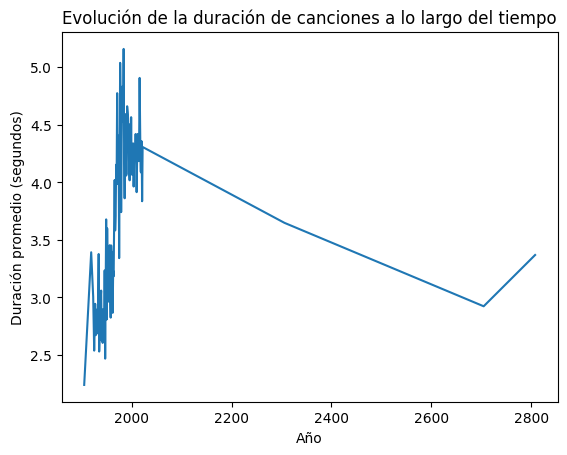

In [ ]:
plt.plot(df_h3["date"], df_h3["length"])
plt.xlabel("Año")
plt.ylabel("Duración promedio (segundos)")
plt.title("Evolución de la duración de canciones a lo largo del tiempo")
plt.show()

Como podemos ver en el gráfico, se podría decir que no se llega a confirmar totalmente la hipótesis, ya que no se ve una disminución notable en las longitudes de las canciones a medida que avanzan los años. Sin embargo, se puede observar que, en comparación a ciertos años anteriores, si han disminuido los promedios de las duraciones.

Para reforzar el análisis, observaremos la distribución completa y no sólo la media. Pero, en vez de visualizar por año, para facilitar, se ha agrupado por década.


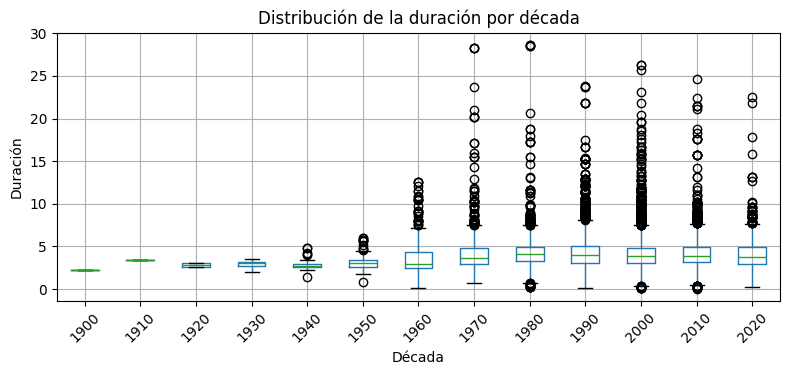

In [ ]:
df.boxplot(column="length", by="decada", figsize=(8, 4), rot=45)
plt.title("Distribución de la duración por década")
plt.suptitle("")
plt.xlabel("Década")
plt.ylabel("Duración")
plt.tight_layout()
plt.show()

En este gráfico, cada caja representa la distribución de la duración de las canciones para cada año.
Al ver los años más recientes, se puede ver que la mediana y los cuartiles disminuyen levemente. Esto indica que las duraciones han disminuido un poco. Sin embargo, considerando lo analizado anteriormente, creemos que no se podría confirmar totalmente la hipótesis. Ya que no vemos una disminución lineal o notable.
Además, notamos que en años más recientes, aparecen muchos outliers pero, en proporción al total de canciones, son relativamente pocos.
Entonces, observando este gráfico, no se confirma la hipótesis totalmente, pero se tiene en cuenta este hallazgo para futuros análisis.



---


### **Hipótesis 4**
**El género Pop y Dance suelen ser los géneros que tienen mayor valor de "happy" y de "danceable".**

Para esta hipótesis, vamos a usar la columna `genre_rosamerica` en vez de las otras, ya que es la de mayor variabilidad de géneros.
En primer lugar, vamos a sacar el promedio de `happy` y `danceable` por cada género.

In [ ]:
# Tabla de promedio de happy y danceable por género
df_h4 = df.groupby("genre_rosamerica")[["happy", "danceable"]].mean().reset_index()
df_h4

,genre_rosamerica,happy,danceable
0,Classic,0.352271,0.100266
1,Dance,0.351698,0.884083
2,Hip-Hop,0.283891,0.868114
3,Jazz,0.331014,0.239207
4,Pop,0.504140,0.612846
5,Rhythmic,0.356501,0.484701
6,Rock,0.482612,0.450272
7,Speech,0.210038,0.262798


A simple vista, podemos ver que:
*   El género con mayor promedio de `happy` es Pop, y luego Rock. Dance está en un tercer lugar, luego de Rock.
*   El género con mayor promedio de `danceable` es Dance, y luego Hip-Hop. Pop está en un tercer lugar, luego de Hip-Hop.

Observando esto, podemos notar que los géneros analizados (Pop Y Dance), se encuentran entre los valores más altos de `happy` y `danceable`.

A continuación, vamos a crear dos gráficos de barras, uno por happy y otro por danceable, para ver bien la diferencia.

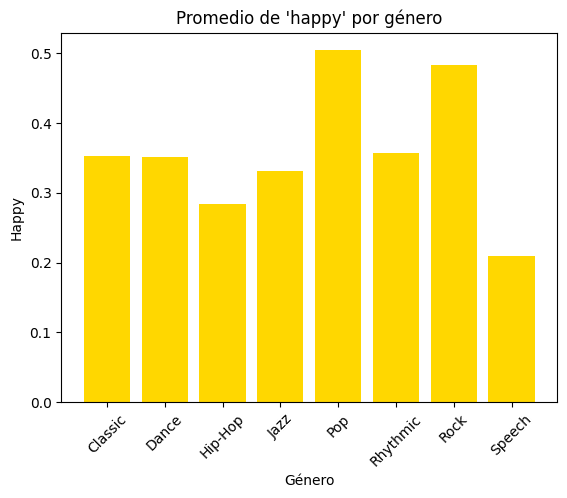

In [ ]:
plt.bar(df_h4["genre_rosamerica"], df_h4["happy"], color="gold")
plt.xlabel("Género")
plt.xticks(rotation=45)
plt.ylabel("Happy")
plt.title("Promedio de 'happy' por género")
plt.show()

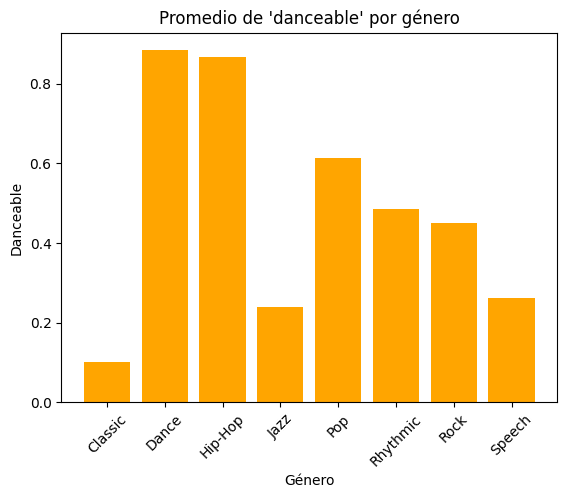

In [ ]:
plt.bar(df_h4["genre_rosamerica"], df_h4["danceable"], color="orange")
plt.xlabel("Género")
plt.xticks(rotation=45)
plt.ylabel("Danceable")
plt.title("Promedio de 'danceable' por género")
plt.show()

Como se puede observar en los gráficos y como se comentó más arriba, el género con mayor valor de 'happy' es Pop, pero Dance no ocupa el segundo lugar sino que lo ocupa el Rock, con un valor muy cercano a Pop.

Por el otro lado, el género con mayor valor de "danceable" es Dance, pero Pop no ocupa el segundo lugar sino que lo ocupa Hip-Hop, cuyo valor igualmente no difiere demasiado.

Teniendo en cuenta estos valores, de todas formas se observa que ambos géneros presentan valores relativamente altos, para esas propiedades, en comparación con los otros géneros.

Por lo anterior, llegamos a la conclusión que la hipótesis ***se cumple parcialmente***.

### **Hipótesis 5**
**Las canciones de género Jazz suelen ser más "relaxed" que las canciones de género Rock.**

Comenzamos sacando el promedio de "relaxed" para todos los géneros, y revisamos los géneros Jazz y Rock.

In [ ]:
# Tabla de promedio de relaxed por género
df_h5 = df.groupby("genre_rosamerica")[["relaxed"]].mean().reset_index()
df_h5

,genre_rosamerica,relaxed
0,Classic,0.821958
1,Dance,0.530140
2,Hip-Hop,0.506499
3,Jazz,0.817365
4,Pop,0.538232
5,Rhythmic,0.715705
6,Rock,0.261463
7,Speech,0.788595


A simple vista, se puede ver que Jazz es más "relaxed" que Rock, por lo que la hipótesis se confirmaría.

Igualmente, vamos a hacer un gráfico de barras para confirmar esto.

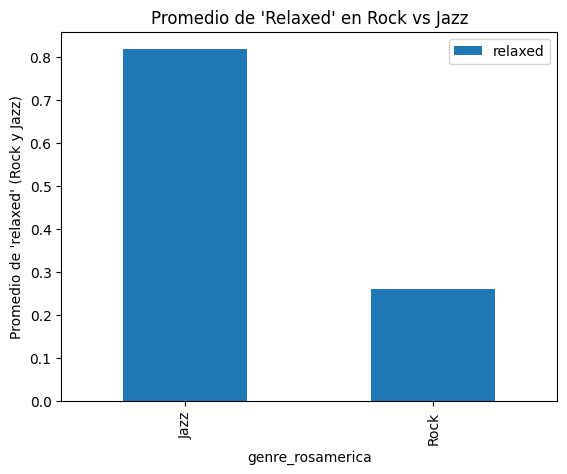

In [ ]:
# Se filtra la tabla anterior solo por los géneros Rock y Jazz
df_h5_rock_jazz = df_h5[df_h5["genre_rosamerica"].isin(["Rock", "Jazz"])]

df_h5_rock_jazz.plot(x="genre_rosamerica", y="relaxed", kind="bar", title="Promedio de 'Relaxed' en Rock vs Jazz")
plt.ylabel("Promedio de 'relaxed' (Rock y Jazz)")
plt.show()

Ya visualizando el gráfico anterior, llegamos a la conclusión de que la hipótesis ***se confirma***, ya que el porcentaje o la proporción de 'relaxed' para el género Jazz es significativamente mayor que para el género Rock.

### **Hipótesis 6**
La variabilidad en los géneros de canciones lanzadas por año ha aumentado.


Para analizar esta hipótesis, inicialmente debemos agrupar los datos según las décadas y los géneros. Para ello, se utilizará como género `genre_rosamerica` ya que consideramos que es el que más se adecúa en las canciones.

In [ ]:
df_h6 = df[df["decada"] != 0]

conteo_genero_decada = df_h6.groupby(['decada', 'genre_rosamerica']).size().reset_index(name='conteo')
conteo_genero_decada

,decada,genre_rosamerica,conteo
0,1900,Classic,1
1,1910,Jazz,1
2,1920,Classic,11
3,1930,Classic,33
4,1930,Jazz,2
...,...,...,...
64,2020,Jazz,60
65,2020,Pop,193
66,2020,Rhythmic,278
67,2020,Rock,232


Observando esta tabla obtenida, a simple vista se podría decir que a medida que avanzan los años, si se ha notado un aumento en la cantidad de géneros de canciones. Sin embargo, esto podría deberse también a que los datos obtenidos son en base al top 50 de artistas y canciones de cada país, por lo que probablemente, haya una menor cantidad de canciones más antiguas.

Entonces, ahora calcularemos la variabilidad o diversidad de géneros por décadas.

In [ ]:
variabilidad_por_decada = conteo_genero_decada.groupby('decada')['genre_rosamerica'].nunique().reset_index(name='cantidad_generos_unicos')
variabilidad_por_decada

,decada,cantidad_generos_unicos
0,1900,1
1,1910,1
2,1920,1
3,1930,3
4,1940,3
5,1950,5
6,1960,8
7,1970,7
8,1980,8
9,1990,8


Observando esta otra tabla, se podría decir que la hipótesis se confirma, ya que se ve un notable aumento en la cantidad de géneros por década.
A continuación, realizaremos un gráfico para poder visualizar mejor lo analizado.

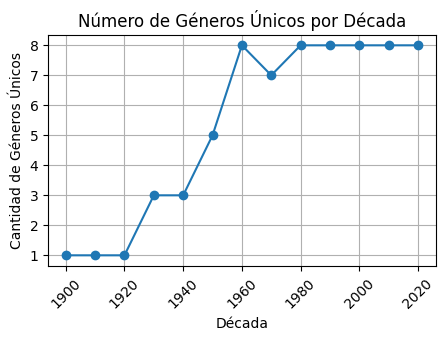

In [ ]:
plt.figure(figsize=(5, 3))
plt.plot(variabilidad_por_decada['decada'], variabilidad_por_decada['cantidad_generos_unicos'], marker='o')
plt.title('Número de Géneros Únicos por Década')
plt.xlabel('Década')
plt.ylabel('Cantidad de Géneros Únicos')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

Teniendo en cuenta todo lo analizado anteriormente, se podría decir que se **confirma** la hipótesis ya que observamos una tendencia ascendente a lo largo de los años.

In [ ]:
# Exportación de DataFrame final

df.to_csv('acousticbrainz_canciones.csv', index=False)
from google.colab import files
files.download('acousticbrainz_canciones.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>